<a href="https://colab.research.google.com/github/k73kahori/kaggle-notebook/blob/main/Personalized_Medicine_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Personalized Medicine: Redefining Cancer Treatment**  
引用：https://www.kaggle.com/competitions/msk-redefining-cancer-treatment/data

## Table of Contents  
- Overview  
- Load libraries  
- Verifying Data  
- Baseline model  
- Model Improvements  
  - Bag of Words方式  
  - TF-IDF方式  
- Summary


## 【Overview】
1. Issue  
腫瘍組織は多くの遺伝子変異を有するが、その変異ががんの発生や進展に寄与するものであるか（ドライバー遺伝子）、がんの発生には無関係な変異か（パッセンジャー遺伝子）を区別することが重要になる。  
現在、これらの遺伝子変異の解釈は、臨床病理医が１つ１つの変異について文献情報を確認し手作業で分類を行っており、このプロセスには非常に多くの時間と労力を要している。

2. Study Aim  
本ノートブックでは、テキストベースの臨床エビデンスを元に遺伝子変異を分類する機械学習モデルを構築する。  
遺伝子変異の種類を9つのクラスに分類する、多クラス分類モデルを作成する。  
この機械学習モデルは、Issueで挙げた腫瘍組織の遺伝子変異を分類する現行のプロセスのコストを大幅に削減することに寄与するものである。

2. Datasets  
本ノートブックの課題およびデータセットは、kaggleのコンペティションに出典されていたものである。  
学習データは、２つのデータセットからなり、１つは（training_variants）、分類済みの数千の遺伝子変異情報が含まれ、もう1つは（training_text）は、専門家が変異の分類に用いる臨床エビデンス（テキスト形式）が含まれる。  
両者はIDによってリンクしている。

---

## 【Load libraries】

In [ ]:
# ライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# 文章データの分析
import re
import collections
from sklearn.feature_extraction import DictVectorizer

# ロジスティック回帰モデル
from sklearn.linear_model import LogisticRegression

# Keras
from tensorflow import keras
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras import regularizers

# データの分割
from sklearn.model_selection import train_test_split

# モデルの評価
from sklearn.metrics import classification_report
from sklearn.metrics import log_loss

# JupyterNotebook上でグラフを表示する設定
%matplotlib inline
# DataFrameで全ての列を表示する設定
pd.options.display.max_columns = None

In [ ]:
# Google driveのマウント
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


---

## 【Verifying Data】

#### １．ラベルデータ

In [ ]:
# training_variantsのファイルを読み込む
var_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Personalized Medicine/training_variants')

In [ ]:
# 形状を確認
print(var_data.shape)

(3321, 4)


In [ ]:
var_data.head()

,ID,Gene,Variation,Class
0,0,FAM58A,Truncating Mutations,1
1,1,CBL,W802*,2
2,2,CBL,Q249E,2
3,3,CBL,N454D,3
4,4,CBL,L399V,4


各カラムの説明  
- ID：training_text(classを決める根拠になっている論文のテキストデータ)のIDとリンクしている  
- Gene：変異が存在する遺伝子名  
- Variation：この遺伝子変異によるアミノ酸の変化  
- Class：遺伝子変異の種類を1~9に分類

In [ ]:
# Gene列の要素数を確認
sr_gene = var_data["Gene"].value_counts()
print(sr_gene.shape)

(264,)


264種類の遺伝子について調べられている。

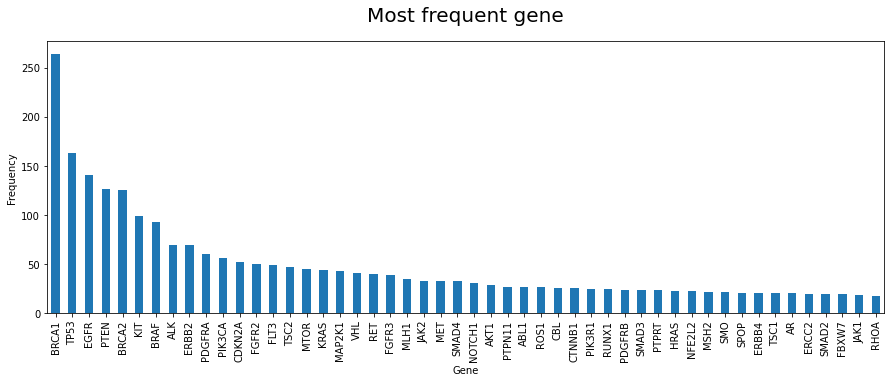

In [ ]:
# データ全体でどのような遺伝子の出現頻度が高いか確認する
# 上位50個のみを棒グラフで可視化
plt.figure(figsize=(15, 5)) 
sr_gene[0:50].plot.bar()
plt.xlabel("Gene")
plt.ylabel("Frequency")
plt.title('Most frequent gene',fontsize=20, x=0.5, y=1.05)
plt.show()

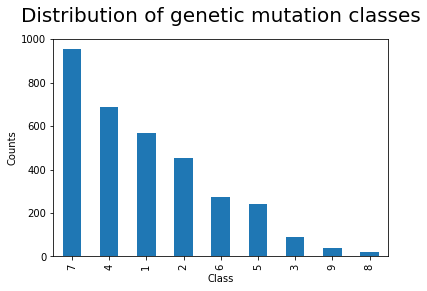

In [ ]:
# Class列の要素数を確認
sr_class = var_data["Class"].value_counts()
# 棒グラフで可視化
sr_class.plot.bar()
plt.xlabel("Class")
plt.ylabel("Counts")
plt.title('Distribution of genetic mutation classes',fontsize=20, x=0.5, y=1.05)
plt.show()

各クラスの確率分布は一様でないことがわかる。    
確率の小さいクラス（Claa 3, 9, 8）は、予測精度が低下する可能性が考えられる。

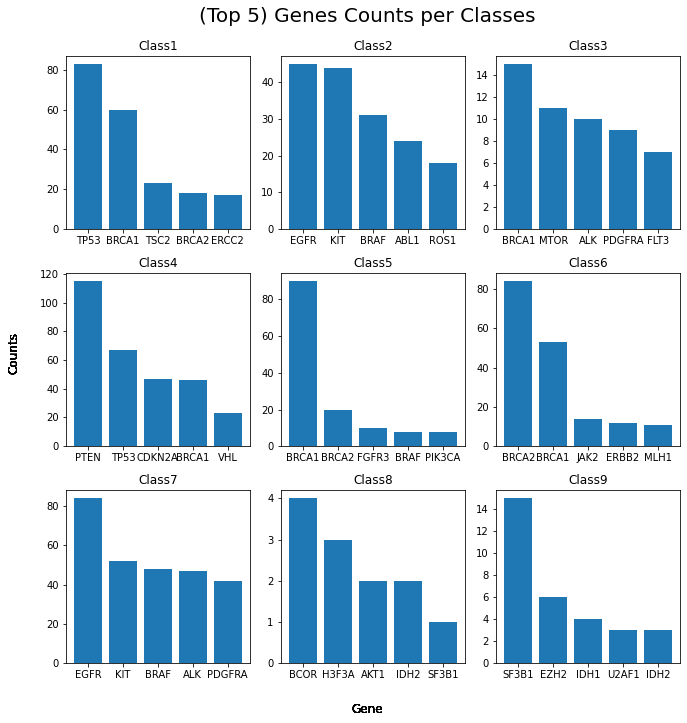

In [ ]:
# クラスごとに出現頻度の高い遺伝子を調べる
nrows, ncols = 3, 3
fig, ax = plt.subplots(nrows, ncols, figsize=(10,10))
fig.suptitle('(Top 5) Genes Counts per Classes',fontsize=20)

# ax[i, j]に画像を描画していく
for i in range(3):
  for j in range(3):
    # ax[i, j]に描画するグラフは、i * 3 + j + 1番目のClassのデータ。これをzとする。
    z = i * 3 + j + 1
    # Class zに分類されるデータを取得
    var_data_class = var_data[var_data["Class"] == z]
    # 遺伝子数をカウント
    gene_count = var_data_class["Gene"].value_counts()

    # 上位5個のみ取得
    x = np.array(gene_count[:5].index)
    y = np.array(gene_count[:5].values)
    x_position = np.arange(len(x))

    # グラフを表示
    ax[i, j].bar(x_position, y, tick_label=x)
    ax[i, j].set_title(f"Class{z}")

    fig.text(0.5, 0, "Gene", horizontalalignment='center', size=12)
    fig.text(0, 0.5, 'Counts', verticalalignment='center', rotation='vertical', size=12)
    fig.tight_layout(rect=[0.03, 0.03, 0.95, 0.95])


#### ２．テキストデータ

In [ ]:
# training_textファイルを１行ずつ読み込み、リスト text_data に格納
with open("/content/drive/MyDrive/Colab Notebooks/Personalized Medicine/training_text", "r") as f:
    text_data = f.readlines()
    # 見出しの行はカット
    text_data.pop(0)  

In [ ]:
# １番目のデータ（ID: 0)の中身を確認
print(text_data[0])

0||Cyclin-dependent kinases (CDKs) regulate a variety of fundamental cellular processes. CDK10 stands out as one of the last orphan CDKs for which no activating cyclin has been identified and no kinase activity revealed. Previous work has shown that CDK10 silencing increases ETS2 (v-ets erythroblastosis virus E26 oncogene homolog 2)-driven activation of the MAPK pathway, which confers tamoxifen resistance to breast cancer cells. The precise mechanisms by which CDK10 modulates ETS2 activity, and more generally the functions of CDK10, remain elusive. Here we demonstrate that CDK10 is a cyclin-dependent kinase by identifying cyclin M as an activating cyclin. Cyclin M, an orphan cyclin, is the product of FAM58A, whose mutations cause STAR syndrome, a human developmental anomaly whose features include toe syndactyly, telecanthus, and anogenital and renal malformations. We show that STAR syndrome-associated cyclin M mutants are unable to interact with CDK10. Cyclin M silencing phenocopies CD

In [ ]:
# training_textファイルの形状を確認
print("Rows : " + str(len(text_data)))

Rows : 3321


---

## 【Baseline model】  


#### １．テキストデータ解析用の関数を作成

In [ ]:
# 文章データに使われている単語ごとの数を返す
def get_word_count(text_data, min_length=5):
    # ノイズの除去
    for ch in ".,:;°!?+*/=|()[]{}<>~^#$@%&'\"_":
        text_data = text_data.replace(ch, " ")
    
    # 形態素解析：文章を単語に分割。リスト型として結果を得る。
    _words = text_data.strip().split()
    # 表記の揺れの補正
    # 単語のリストを受け取り、指定された文字数以上の単語だけをすべて小文字にして返す
    _words = [_word.lower() for _word in _words if len(_word) >= min_length]

    # collections.Counterの戻り値は辞書型のサブクラス
    _count = collections.Counter(_words)

    # 辞書型に変換
    _count = dict(_count)
    
    # 出現数の多い順にソート（戻り値はキーと要素をタプルとしたリスト型になる）
    _count = sorted(_count.items(), key=lambda x:x[1], reverse=True)
    
    # 辞書型に戻す
    _count = dict(_count)
    
    return _count

In [ ]:
# １番目のデータ（ID: 0)で確認
with open("/content/drive/MyDrive/Colab Notebooks/Personalized Medicine/training_text", "r") as f:
    text_data = f.readlines()
    # 見出しの行はカット
    text_data.pop(0)

count_0 = get_word_count(text_data[0])
count_0

{'cyclin': 110,
 'cdk10': 101,
 'cells': 54,
 'expression': 43,
 'protein': 38,
 'levels': 35,
 'fam58a': 33,
 'proteins': 25,
 'which': 23,
 'syndrome': 23,
 'silencing': 22,
 'these': 22,
 'kinase': 20,
 'supplementary': 18,
 'interaction': 17,
 'western': 17,
 'analysis': 17,
 'between': 16,
 'expressed': 16,
 'phosphorylation': 15,
 'detected': 15,
 'cases': 15,
 'shown': 14,
 'human': 14,
 'level': 14,
 'mutations': 13,
 'control': 13,
 'genes': 13,
 'observed': 13,
 'using': 13,
 'buffer': 13,
 'degradation': 12,
 'decreased': 12,
 'found': 12,
 'myc-cdk10': 12,
 'gst-cdk10': 12,
 'deletion': 12,
 'activity': 11,
 'phenotype': 11,
 'controls': 10,
 'increased': 10,
 'results': 10,
 'response': 10,
 'cancer': 9,
 'features': 9,
 'c-raf': 9,
 'sequence': 9,
 'endogenous': 9,
 'result': 9,
 'lymphoblastoid': 9,
 'clinical': 9,
 'online': 9,
 'identified': 8,
 'added': 8,
 'flag-ets2': 8,
 'methods': 8,
 'table': 8,
 'pathway': 7,
 'tamoxifen': 7,
 'functions': 7,
 'whose': 7,
 'inte

- 出現数が1回または2回のみのワードがかなり多くみられる。  
- 出現数の高いワードが、その文章の特徴づけるものと予想し、まずは出現数の高いワードのみを抽出し機械学習を行うこととした。  
- Baseline modelとして、なるべく少ない特徴量でモデルを検討したかったため、以下では出現数30個以上の単語を各文章から抽出した（"30個"の数字についてはとくに根拠ない）。

In [ ]:
# 文章データに使われている単語ごとの数を返す関数の再定義（出現数が30個以上の単語のみ抽出）
def get_word_count(text_data, min_length=5):
    # ノイズの除去
    for ch in ".,:;°!?+*/=|()[]{}<>~^#$@%&'\"_":
        text_data = text_data.replace(ch, " ")
    
    # 形態素解析：文章を単語に分割。リスト型として結果を得る。
    _words = text_data.strip().split()
    # 表記の揺れの補正
    # 単語のリストを受け取り、指定された文字数以上の単語だけをすべて小文字にして返す
    _words = [_word.lower() for _word in _words if len(_word) >= min_length]

    # collections.Counterの戻り値は辞書型のサブクラス
    _count = collections.Counter(_words)

    # 辞書型に変換
    _count = dict(_count)
    
    # 出現数が30個未満のものは除く
    for k, v in list(_count.items()):
        if v < 30:
            _count.pop(k, None)

    # 出現数の多い順にソート（戻り値はキーと要素をタプルとしたリスト型になる）
    _count = sorted(_count.items(), key=lambda x:x[1], reverse=True)
    
    # 辞書型に戻す
    _count = dict(_count)
    
    return _count

In [ ]:
# １番目のデータ（ID: 0)で確認
with open("/content/drive/MyDrive/Colab Notebooks/Personalized Medicine/training_text", "r") as f:
    text_data = f.readlines()
    # 見出しの行はカット
    text_data.pop(0)

count_0 = get_word_count(text_data[0])
count_0

{'cyclin': 110,
 'cdk10': 101,
 'cells': 54,
 'expression': 43,
 'protein': 38,
 'levels': 35,
 'fam58a': 33}

In [ ]:
sum = 0
for v in count_0.values():
    sum += int(v)
print("1番目の文章データに含まれている総単語数：", sum, "個")
print("1番目の文章データに含まれている単語：", len(count_0), "単語")

1番目の文章データに含まれている総単語数： 414 個
1番目の文章データに含まれている単語： 7 単語


ワード数を大幅に絞ることができた。

#### ２．すべての文章データに対してワード抽出を実施

In [ ]:
# training_textファイルを１行ずつ読み込み、リスト text_data に格納
with open("/content/drive/MyDrive/Colab Notebooks/Personalized Medicine/training_text", "r") as f:
    text_data = f.readlines()
    # 見出しの行はカット
    text_data.pop(0)  

In [ ]:
# 形状確認
print(type(text_data))
print(len(text_data))

<class 'list'>
3321


In [ ]:
# 全文章データに対して出現数30個以上のワードを抽出
# 単語ごとの数を格納するリストを用意
word_count_data_all = []

# text_dataに含まれるすべてのデータに対して実施
for text in text_data:
    count_all = get_word_count(text)
    word_count_data_all.append(count_all)

In [ ]:
# リストの長さ確認
len(word_count_data_all)

3321

In [ ]:
# 内容確認
word_count_data_all[0]

{'cyclin': 110,
 'cdk10': 101,
 'cells': 54,
 'expression': 43,
 'protein': 38,
 'levels': 35,
 'fam58a': 33}

In [ ]:
# 行列に変換してdatasetに格納する
vec = DictVectorizer()
dataset_all = vec.fit_transform(word_count_data_all)
dataset_all

<3321x3278 sparse matrix of type '<class 'numpy.float64'>'
	with 57642 stored elements in Compressed Sparse Row format>

各文章データから出現数30個以上のワードを抽出し、それを全文章に対して実施したところ、3278個のワードが抽出できた。

In [ ]:
# 各列に対応した単語を取得
vec.get_feature_names()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['-2-hg',
 '-catenin',
 '-splicing',
 '104-1',
 '104-r',
 '104-s',
 '1100delc',
 '11q22',
 '12p13',
 '14-3-3',
 '14q13',
 '17-aag',
 '1706a',
 '1708e',
 '17q25',
 '184352',
 '185stop',
 '2002a',
 '20q13',
 '291wi',
 '3-kinase',
 '3t3-l1',
 '3′utr',
 '4e-bp1',
 '5-hmc',
 '5382insc',
 '5382stop',
 '53bp1',
 '53bp1−',
 '5438deltgtg',
 '5440deltg',
 '687delt',
 '786-o',
 '8p11-12',
 '9004g',
 '93delg',
 '973-egfr',
 'a-loop',
 'a-raf',
 'a146t',
 'a1708e',
 'a339v',
 'a391e',
 'a614d',
 'a677g',
 'aacrjournals',
 'abc-dlbcl',
 'abcb7',
 'aberrant',
 'aberrations',
 'ability',
 'abiraterone',
 'abnormal',
 'abnormalities',
 'above',
 'absence',
 'absent',
 'according',
 'accumulation',
 'acetate',
 'acetylated',
 'acetylation',
 'achieved',
 'achondroplasia',
 'acids',
 'acinar',
 'acquired',
 'acquisition',
 'acral',
 'across',
 'actionable',
 'activate',
 'activated',
 'activates',
 'activating',
 'activation',
 'active',
 'activities',
 'activity',
 'actn1',
 'acute',
 'acvr1',
 'adaptiv

In [ ]:
# 型の確認
type(dataset_all)

scipy.sparse.csr.csr_matrix

#### ３．モデルの作成

#### ３－１．ロジスティック回帰モデル

In [ ]:
# 説明変数(X)：文章データを形態素解析した結果
# 目的変数(Y)：Class1~Class9
X = dataset_all
Y = np.array(var_data["Class"])

In [ ]:
# データの分割
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
X_train, X_valid, Y_train, Y_valid = train_test_split(X_train, Y_train, test_size=0.3, random_state=0)

In [ ]:
# 形状を確認
print("Y_train=", Y_train.shape, ", X_train=", X_train.shape)
print("Y_valid=", Y_valid.shape, ", X_valid=", X_valid.shape)
print("Y_test=", Y_test.shape, ", X_test=", X_test.shape)

Y_train= (1626,) , X_train= (1626, 3278)
Y_valid= (698,) , X_valid= (698, 3278)
Y_test= (997,) , X_test= (997, 3278)


In [ ]:
logistic_model = LogisticRegression(solver='lbfgs', multi_class='multinomial')
# 学習
logistic_model.fit(X_train, Y_train)
# 予測
Y_pred = logistic_model.predict(X_test)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [ ]:
# モデルの評価
print(classification_report(Y_test, Y_pred))

              precision    recall  f1-score   support

           1       0.53      0.54      0.53       157
           2       0.48      0.42      0.45       143
           3       0.46      0.31      0.37        36
           4       0.59      0.61      0.60       220
           5       0.43      0.42      0.42        77
           6       0.64      0.67      0.65        75
           7       0.62      0.66      0.64       275
           8       0.25      0.25      0.25         4
           9       0.67      0.60      0.63        10

    accuracy                           0.56       997
   macro avg       0.52      0.50      0.51       997
weighted avg       0.56      0.56      0.56       997



#### ≪結果≫  
- f1値の平均は56%であり、かなり精度が低い結果となった。  
- Classによってf1値に大きなばらつきがある。  
- 予想通り、頻度の低いクラス（Class8やClass3)で大きく精度が下がっている。  
- 一方、Class9は頻度が低いにもかかわらず、スコアはさほど悪くはなかった。  
Class9に対しては、良い特徴量が抽出できている可能性が考えられる。

#### ３－２．ディープラーニングモデル  
隠れ層1層、全結合層のみの単純なモデルを試す。

In [ ]:
# 目的変数(Class1～9)をカテゴリー変数化する
var_data2 = pd.get_dummies(data=var_data, columns=['Class'])
var_data2.head()

,ID,Gene,Variation,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9
0,0,FAM58A,Truncating Mutations,1,0,0,0,0,0,0,0,0
1,1,CBL,W802*,0,1,0,0,0,0,0,0,0
2,2,CBL,Q249E,0,1,0,0,0,0,0,0,0
3,3,CBL,N454D,0,0,1,0,0,0,0,0,0
4,4,CBL,L399V,0,0,0,1,0,0,0,0,0


In [ ]:
# 説明変数と目的変数を再定義する
# 説明変数(X)：文章データを形態素解析した結果
# 目的変数(Y)：Class1~Class9をカテゴリー変数化したもの
X = dataset_all
Y = np.array(var_data2.loc[:, "Class_1":"Class_9"])

In [ ]:
# データの確認
Y[0]

array([1, 0, 0, 0, 0, 0, 0, 0, 0], dtype=uint8)

In [ ]:
# データの分割
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
X_train, X_valid, Y_train, Y_valid = train_test_split(X_train, Y_train, test_size=0.3, random_state=0)

In [ ]:
# 形状を確認
print("Y_train=", Y_train.shape, ", X_train=", X_train.shape)
print("Y_valid=", Y_valid.shape, ", X_valid=", X_valid.shape)
print("Y_test=", Y_test.shape, ", X_test=", X_test.shape)

Y_train= (1626, 9) , X_train= (1626, 3278)
Y_valid= (698, 9) , X_valid= (698, 3278)
Y_test= (997, 9) , X_test= (997, 3278)


In [ ]:
# モデルの初期化
model = keras.Sequential()

# 入力層
model.add(Dense(256, activation='relu', input_shape=(3278,)))
# 隠れ層
model.add(Dense(128, activation='relu'))
# 出力層
model.add(Dense(9, activation='softmax'))

# モデルの構築
model.compile(optimizer="rmsprop", loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
# モデルの構造を表示
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 256)               839424    
                                                                 
 dense_13 (Dense)            (None, 128)               32896     
                                                                 
 dense_14 (Dense)            (None, 9)                 1161      
                                                                 
Total params: 873,481
Trainable params: 873,481
Non-trainable params: 0
_________________________________________________________________


In [ ]:
%%time
# 学習の実施
log = model.fit(X_train, Y_train, epochs=1000, batch_size=32, verbose=True, callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=100, verbose=1)], validation_data=(X_valid, Y_valid))

Epoch 1/1000


/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/indexed_slices.py:446: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/sequential_4/dense_12/embedding_lookup_sparse/Reshape_1:0", shape=(None,), dtype=int32), values=Tensor("gradient_tape/sequential_4/dense_12/embedding_lookup_sparse/Reshape:0", shape=(None, 256), dtype=float32), dense_shape=Tensor("gradient_tape/sequential_4/dense_12/embedding_lookup_sparse/Cast:0", shape=(2,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "shape. This may consume a large amount of memory." % value)


51/51 [==============================] - 1s 8ms/step - loss: 2.5266 - accuracy: 0.4520 - val_loss: 1.6430 - val_accuracy: 0.5831
Epoch 2/1000
51/51 [==============================] - 0s 5ms/step - loss: 1.0236 - accuracy: 0.7042 - val_loss: 1.8906 - val_accuracy: 0.5043
Epoch 3/1000
51/51 [==============================] - 0s 5ms/step - loss: 0.7570 - accuracy: 0.7743 - val_loss: 1.5380 - val_accuracy: 0.6218
Epoch 4/1000
51/51 [==============================] - 0s 5ms/step - loss: 0.6473 - accuracy: 0.8026 - val_loss: 1.9463 - val_accuracy: 0.5688
Epoch 5/1000
51/51 [==============================] - 0s 6ms/step - loss: 0.5912 - accuracy: 0.8173 - val_loss: 1.7783 - val_accuracy: 0.6132
Epoch 6/1000
51/51 [==============================] - 0s 5ms/step - loss: 0.5142 - accuracy: 0.8339 - val_loss: 1.9525 - val_accuracy: 0.6318
Epoch 7/1000
51/51 [==============================] - 0s 5ms/step - loss: 0.5437 - accuracy: 0.8389 - val_loss: 2.0732 - val_accuracy: 0.6261
Epoch 8/1000
51/51 

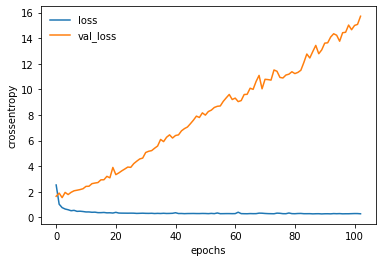

In [ ]:
# グラフの表示
plt.plot(log.history["loss"], label="loss")
plt.plot(log.history["val_loss"], label="val_loss")
plt.legend(frameon=False)
plt.xlabel("epochs")
plt.ylabel("crossentropy")
plt.show()

強い過学習が見られる。  
一旦、テストデータによる評価まで実施する。

In [ ]:
# 一旦テストデータによる評価まで実施
Y_pred_0 = model.predict(X_test)

# 予測結果の各リストにおける妻財地のインデックスを取得
Y_pred = np.argmax(Y_pred_0, axis=1)

32/32 [==============================] - 0s 2ms/step


In [ ]:
Y_pred_0.shape

(997, 9)

In [ ]:
# 確認
Y_pred

array([3, 5, 1, 3, 2, 4, 1, 6, 6, 1, 3, 0, 6, 1, 0, 5, 6, 3, 1, 6, 0, 6,
       6, 3, 6, 0, 4, 3, 6, 3, 5, 3, 3, 3, 0, 5, 6, 3, 1, 3, 7, 5, 2, 6,
       3, 1, 0, 5, 3, 3, 6, 3, 1, 3, 0, 3, 4, 6, 0, 1, 5, 2, 4, 3, 6, 6,
       6, 6, 6, 6, 2, 0, 3, 4, 3, 3, 0, 3, 2, 1, 6, 6, 2, 6, 6, 3, 0, 6,
       1, 6, 6, 3, 3, 5, 5, 1, 6, 3, 0, 3, 6, 3, 0, 1, 6, 6, 0, 6, 5, 6,
       6, 3, 1, 4, 4, 2, 0, 5, 3, 3, 0, 3, 0, 3, 0, 3, 3, 3, 1, 5, 5, 6,
       6, 3, 3, 6, 3, 3, 6, 3, 6, 6, 0, 1, 0, 3, 4, 6, 3, 6, 6, 6, 6, 4,
       4, 6, 0, 1, 4, 4, 0, 4, 6, 5, 3, 5, 5, 0, 3, 6, 6, 3, 6, 1, 6, 6,
       6, 5, 6, 3, 0, 6, 0, 3, 6, 6, 6, 6, 0, 6, 1, 6, 1, 3, 5, 6, 3, 1,
       5, 6, 5, 0, 0, 3, 3, 5, 3, 0, 0, 6, 3, 6, 0, 0, 5, 0, 6, 5, 6, 6,
       5, 6, 3, 6, 3, 4, 3, 6, 3, 4, 6, 6, 1, 6, 1, 0, 0, 6, 1, 6, 6, 1,
       3, 3, 6, 3, 0, 3, 1, 4, 5, 3, 1, 1, 6, 4, 4, 6, 2, 3, 6, 3, 3, 3,
       6, 1, 3, 3, 3, 6, 6, 6, 3, 3, 2, 6, 4, 1, 6, 6, 2, 3, 6, 1, 3, 6,
       3, 7, 6, 5, 6, 5, 6, 3, 1, 3, 6, 1, 6, 4, 1,

In [ ]:
# カテゴリー変数の復元
Y_test_ = np.argmax(Y_test, axis=1)

In [ ]:
# 確認
Y_test_

array([6, 5, 1, 3, 2, 4, 0, 6, 5, 6, 3, 0, 6, 1, 1, 0, 1, 3, 6, 6, 3, 1,
       5, 3, 6, 0, 6, 3, 4, 3, 6, 3, 6, 3, 1, 5, 1, 3, 6, 1, 7, 5, 6, 1,
       3, 6, 3, 0, 1, 3, 6, 3, 6, 2, 5, 3, 4, 6, 0, 1, 5, 6, 4, 3, 6, 6,
       6, 1, 3, 6, 2, 0, 3, 5, 6, 3, 2, 3, 5, 1, 1, 6, 1, 1, 1, 3, 0, 6,
       6, 6, 1, 3, 3, 6, 5, 1, 4, 3, 5, 3, 3, 6, 4, 3, 6, 6, 0, 6, 0, 3,
       6, 3, 3, 0, 4, 0, 5, 5, 6, 0, 0, 3, 0, 3, 0, 3, 3, 0, 0, 0, 5, 6,
       3, 3, 3, 6, 3, 3, 6, 3, 6, 6, 0, 1, 0, 3, 4, 6, 2, 4, 6, 6, 0, 4,
       0, 6, 4, 1, 0, 0, 3, 6, 0, 5, 3, 3, 6, 3, 6, 6, 6, 5, 3, 6, 6, 6,
       6, 5, 2, 6, 0, 0, 0, 3, 3, 6, 6, 5, 4, 6, 6, 6, 1, 3, 5, 4, 3, 0,
       5, 3, 5, 0, 3, 6, 1, 5, 1, 0, 0, 6, 0, 6, 6, 0, 5, 0, 6, 0, 6, 1,
       5, 6, 0, 6, 3, 4, 3, 5, 3, 2, 6, 1, 1, 6, 6, 4, 0, 1, 1, 1, 6, 6,
       3, 3, 6, 2, 0, 4, 1, 4, 5, 3, 1, 7, 6, 0, 6, 6, 2, 3, 0, 3, 0, 0,
       6, 1, 0, 3, 6, 6, 5, 1, 3, 3, 4, 5, 0, 3, 5, 6, 0, 1, 6, 6, 1, 0,
       4, 8, 3, 0, 6, 5, 2, 3, 1, 3, 6, 1, 6, 6, 3,

In [ ]:
# モデルの評価
print(classification_report(Y_test_, Y_pred))

              precision    recall  f1-score   support

           0       0.50      0.44      0.47       157
           1       0.47      0.40      0.43       143
           2       0.36      0.25      0.30        36
           3       0.61      0.68      0.64       220
           4       0.42      0.39      0.41        77
           5       0.62      0.60      0.61        75
           6       0.59      0.68      0.63       275
           7       0.50      0.25      0.33         4
           8       1.00      0.50      0.67        10

    accuracy                           0.55       997
   macro avg       0.56      0.46      0.50       997
weighted avg       0.55      0.55      0.55       997



#### ≪結果≫  
- Class番号がずれて0～8までになっているが、これはカテゴリー変数化の復元でインデックス番号で出力されたためである。  
- ほぼ二分の一に近い確率で精度が課題である。  
- 過学習の解消も課題である。  

方針として以下を検討する。  
- ロジスティック回帰モデル、全結合層のDLモデルいずれにおいても精度が課題。  
特徴量の抽出から見直す必要がある。  
- やはり「各文章から出現数30個以上のワード」というのは、特徴量選択として根拠が弱く、精度も出せなかったため、もう少し特徴量を増やす方向で検討する。  
- 全てのワードを抽出すると、数字のみで構成されるワードや、数字と記号のみで構成されているワードなども含まれてくるため、これらは正規表現（ASCIIコード）を活用し除去することにする。  
- stop wordsの活用によりノイズを除去することも必要である。  
- ワードの出現数を特徴量とするBag of Words方式だけでなく、TF-IDF方式も検討する。


---

## 【Bag of Words】

#### １．テキストデータ解析用の関数を再定義   
特徴量生成の精度を高めることを目的に、関数を再定義した

In [ ]:
# テキストを分析対象のワードリストに変換し、ワードの出現数をカウントする関数
# get_word_count2とする
def get_word_count2(text_data, min_length=3):
    # ノイズの除去
    for ch in ".,:;°!?+*/=|()[]{}<>~^#$@%&'\"_":
        text_data = text_data.replace(ch, " ")
    
    # 形態素解析：スペースで分割（戻り値はリスト型）
    results = text_data.strip().split()
    
    # 小文字化（表記の揺れを補正）
    results = [result.lower() for result in results if len(result) >= min_length]
    
    # stop_wordsの定義
    stop_words = ['fig', 'figs', 'however', 'whereas', 'another', 'either', 'yet', 'known', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves',\
            'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',\
            'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'whose', 'this', 'that',\
            "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', \
            'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'thus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into',\
            'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such',\
            'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'could', 'will', 'would', 'may', 'might', 'must', 'just', 'don', "don't", 'should', "should've",\
            'now', 'd', 'll', 'm', 'o', 're', 've', 'y', 'ain', 'aren', "aren't", 'cannot', 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't",\
            'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn',\
            "shouldn't", 'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"]

   # 分析対象外のワードを除去
    words = []
    for word in results:
        if len(word) < 3:
            # 2文字以下のワード
            continue

        elif re.match(r"^[0-9!-/:-@¥[-`{-~–·•]+$", word):
            # 数字や記号だけで構成されたワード(ASCIIコード表の記号と–·•を指定)
            # ^:文字列の先頭、$:文字列の末尾、[]:カッコ内にある任意の1文字
            continue

        elif re.match(r"^[0-9]+.*$", word):
            # 数字からはじまるワード
            continue

        elif word in stop_words:
            # stop_wordsに該当するもの
            continue
        
        words.append(word)
        
    # ワードごとの出現数を数える（戻り値は辞書型のサブクラス）    
    count = collections.Counter(words)

    # 辞書型に変換
    count = dict(count)

    # 出現数が3個未満のものは除く
    for k, v in list(count.items()):
        if v < 3:
            count.pop(k, None)
            
    # 出現数の多い順にソート（戻り値はキーと要素をタプルとしたリスト型になる）
    count = sorted(count.items(), key=lambda x:x[1], reverse=True)
    
    # 辞書型に戻す
    count = dict(count)
    
    return count

In [ ]:
# １番目のデータ（ID: 0)で確認
with open("/content/drive/MyDrive/Colab Notebooks/Personalized Medicine/training_text", "r") as f:
    text_data = f.readlines()
    # 見出しの行はカット
    text_data.pop(0)

count_0 = get_word_count2(text_data[0])
count_0

{'cyclin': 110,
 'cdk10': 101,
 'ets2': 54,
 'cells': 54,
 'expression': 43,
 'protein': 38,
 'levels': 35,
 'fam58a': 33,
 'star': 33,
 'proteins': 25,
 'syndrome': 23,
 'silencing': 22,
 'cell': 22,
 'kinase': 20,
 'supplementary': 18,
 'interaction': 17,
 'western': 17,
 'analysis': 17,
 'mcf7': 16,
 'expressed': 16,
 'phosphorylation': 15,
 'detected': 15,
 'cases': 15,
 'shown': 14,
 'human': 14,
 'level': 14,
 'blot': 14,
 'line': 14,
 'mutations': 13,
 'control': 13,
 'genes': 13,
 'gene': 13,
 'observed': 13,
 'using': 13,
 'buffer': 13,
 'case': 13,
 'degradation': 12,
 'decreased': 12,
 'found': 12,
 'myc-cdk10': 12,
 'gst-cdk10': 12,
 'deletion': 12,
 'activity': 11,
 'also': 11,
 'two': 11,
 'phenotype': 11,
 'mrna': 11,
 'controls': 10,
 'increased': 10,
 'results': 10,
 'response': 10,
 'cancer': 9,
 'features': 9,
 'c-raf': 9,
 'sequence': 9,
 'endogenous': 9,
 'result': 9,
 'lymphoblastoid': 9,
 'clinical': 9,
 'online': 9,
 'identified': 8,
 'y2h': 8,
 'added': 8,
 'fl

In [ ]:
# 1番目の文章データから抽出したワードの個数を確認
sum = 0
for v in count_0.values():
    sum += int(v)
print("1番目の文章データに含まれている総ワード数：", sum, "ワード")
print("1番目の文章データに含まれているワードの種類：", len(count_0), "種類")

1番目の文章データに含まれている総ワード数： 2293 ワード
1番目の文章データに含まれているワードの種類： 318 種類


 #### ２．すべての文章データに対してワード抽出を行う

In [ ]:
# training_textファイルを１行ずつ読み込み、リスト text_data に格納
with open("/content/drive/MyDrive/Colab Notebooks/Personalized Medicine/training_text", "r") as f:
    text_data = f.readlines()
    # 見出しの行はカット
    text_data.pop(0)  

In [ ]:
# 形状確認
print(type(text_data))
print(len(text_data))

<class 'list'>
3321


In [ ]:
# 全文章データのワード解析

# ワードごとの出現数のリスト
word_count_data_all = []
# text_dataに含まれるすべてのデータに対して実施
for text in text_data:
    count_all = get_word_count2(text)
    word_count_data_all.append(count_all)

In [ ]:
# リストの長さ確認
len(word_count_data_all)

3321

In [ ]:
# 行列に変換してdatasetに格納する
vec = DictVectorizer()
dataset_all = vec.fit_transform(word_count_data_all)
dataset_all

<3321x47843 sparse matrix of type '<class 'numpy.float64'>'
	with 1497981 stored elements in Compressed Sparse Row format>

全ての文章データに、47843種類の単語が存在

In [ ]:
# 各列に対応した単語を取得
vec.get_feature_names()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['\x0112',
 '--mate-inner-dist',
 '-1022g',
 '-113c',
 '-14g',
 '-173g',
 '-2-hg',
 '-2-hydroxyglutarate',
 '-2101c',
 '-212c',
 '-2266a',
 '-2266g',
 '-238a',
 '-29del',
 '-2a',
 '-2hg',
 '-2α',
 '-3-carboxamide',
 '-308a',
 '-318c',
 '-3h',
 '-3’',
 '-3′',
 '-4-methyl-4′-',
 '-428a',
 '-453delcctt',
 '-609g',
 '-63-linked',
 '-7-oxozeaenol',
 '-857c',
 '-857t',
 '-8a',
 '-8b',
 '-8l',
 '-actin',
 '-agarose',
 '-alk',
 '-amide',
 '-aml',
 '-arg',
 '-associated',
 '-atp',
 '-b2',
 '-ba',
 '-based',
 '-bcl10',
 '-binding',
 '-bound',
 '-brd4',
 '-c121s',
 '-catenin',
 '-catenin-dependent',
 '-cdna',
 '-cell',
 '-chains',
 '-conjugated',
 '-containing',
 '-cry2',
 '-d281g-4',
 '-d835v',
 '-d835y',
 '-d839g',
 '-defective',
 '-deleted',
 '-deoxycytidine',
 '-dependent',
 '-dhfr',
 '-dichlorofluorescein',
 '-dnt',
 '-domain-containing',
 '-dr103',
 '-e2',
 '-e453k',
 '-ecori',
 '-egfp',
 '-egfr',
 '-egfr-l858r-t790m-ha',
 '-end',
 '-enhancer',
 '-epor',
 '-exome',
 '-expressing',
 '-eµ-myc

今回、ハイフンは除去していないため（IL-2, IL-4などのハイフンを含む単語が多く存在するため）、ノイズのようなワードも残されているように見られるが、とりあえずこちらの特徴量でモデル作成～評価まで実施してみることにした。

 #### ３．モデルの作成

#### ３－１．ロジスティック回帰モデル

In [ ]:
# 説明変数(X)：文章データを形態素解析した結果（本当は遺伝子名も入れたい）
# 目的変数(Y)：Class1~Class9
X = dataset_all
Y = np.array(var_data["Class"])

In [ ]:
# データの分割
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
X_train, X_valid, Y_train, Y_valid = train_test_split(X_train, Y_train, test_size=0.3, random_state=0)

In [ ]:
# 形状を確認
print("Y_train=", Y_train.shape, ", X_train=", X_train.shape)
print("Y_valid=", Y_valid.shape, ", X_valid=", X_valid.shape)
print("Y_test=", Y_test.shape, ", X_test=", X_test.shape)

Y_train= (1626,) , X_train= (1626, 47843)
Y_valid= (698,) , X_valid= (698, 47843)
Y_test= (997,) , X_test= (997, 47843)


In [ ]:
logistic_model = LogisticRegression(solver='lbfgs', multi_class='multinomial')
# 学習
logistic_model.fit(X_train, Y_train)
# 予測
Y_pred = logistic_model.predict(X_test)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [ ]:
# モデルの評価
print(classification_report(Y_test, Y_pred))

              precision    recall  f1-score   support

           1       0.55      0.62      0.58       157
           2       0.54      0.54      0.54       143
           3       0.44      0.31      0.36        36
           4       0.69      0.67      0.68       220
           5       0.49      0.36      0.42        77
           6       0.65      0.69      0.67        75
           7       0.68      0.70      0.69       275
           8       0.50      0.25      0.33         4
           9       0.54      0.70      0.61        10

    accuracy                           0.62       997
   macro avg       0.56      0.54      0.54       997
weighted avg       0.61      0.62      0.61       997



#### ≪結果≫  
- ベースラインよりも精度が上がった。  
- Class3やClass7などの出現頻度の低いクラスの予測精度がとくに向上した。  
- 全体としてはまだ60%台なのでまだまだといったところ。

#### ３－２．ディープラーニングモデル

In [ ]:
# 目的変数(Class1～9)をカテゴリー変数化する
var_data2 = pd.get_dummies(data=var_data, columns=['Class'])
var_data2.head()

,ID,Gene,Variation,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9
0,0,FAM58A,Truncating Mutations,1,0,0,0,0,0,0,0,0
1,1,CBL,W802*,0,1,0,0,0,0,0,0,0
2,2,CBL,Q249E,0,1,0,0,0,0,0,0,0
3,3,CBL,N454D,0,0,1,0,0,0,0,0,0
4,4,CBL,L399V,0,0,0,1,0,0,0,0,0


In [ ]:
# 説明変数と目的変数を再定義する
# 説明変数(X)：文章データを形態素解析した結果（本当は遺伝子名も入れたい）
# 目的変数(Y)：Class1~Class9をカテゴリー変数化したもの
X = dataset_all
Y = np.array(var_data2.loc[:, "Class_1":"Class_9"])

In [ ]:
# データの分割
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
X_train, X_valid, Y_train, Y_valid = train_test_split(X_train, Y_train, test_size=0.3, random_state=0)

In [ ]:
# 形状を確認
print("Y_train=", Y_train.shape, ", X_train=", X_train.shape)
print("Y_valid=", Y_valid.shape, ", X_valid=", X_valid.shape)
print("Y_test=", Y_test.shape, ", X_test=", X_test.shape)

Y_train= (1626, 9) , X_train= (1626, 47843)
Y_valid= (698, 9) , X_valid= (698, 47843)
Y_test= (997, 9) , X_test= (997, 47843)


In [ ]:
# モデルの初期化
model = keras.Sequential()

# 入力層
model.add(Dense(128, activation='relu', input_shape=(47843,)))
# 隠れ層
model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.01)))
# 出力層
model.add(Dense(9, activation='softmax'))

# モデルの構築
model.compile(optimizer="rmsprop", loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
# モデルの構造を表示
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 128)               6124032   
                                                                 
 dense_16 (Dense)            (None, 64)                8256      
                                                                 
 dense_17 (Dense)            (None, 9)                 585       
                                                                 
Total params: 6,132,873
Trainable params: 6,132,873
Non-trainable params: 0
_________________________________________________________________


In [ ]:
%%time
# 学習の実施
log = model.fit(X_train, Y_train, epochs=1000, batch_size=32, verbose=True, callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=100, verbose=1)], validation_data=(X_valid, Y_valid))

Epoch 1/1000


/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/indexed_slices.py:446: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/sequential_5/dense_15/embedding_lookup_sparse/Reshape_1:0", shape=(None,), dtype=int32), values=Tensor("gradient_tape/sequential_5/dense_15/embedding_lookup_sparse/Reshape:0", shape=(None, 128), dtype=float32), dense_shape=Tensor("gradient_tape/sequential_5/dense_15/embedding_lookup_sparse/Cast:0", shape=(2,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "shape. This may consume a large amount of memory." % value)


51/51 [==============================] - 1s 11ms/step - loss: 8.0491 - accuracy: 0.4643 - val_loss: 6.2602 - val_accuracy: 0.5387
Epoch 2/1000
51/51 [==============================] - 0s 7ms/step - loss: 4.9725 - accuracy: 0.6525 - val_loss: 4.2013 - val_accuracy: 0.5989
Epoch 3/1000
51/51 [==============================] - 0s 7ms/step - loss: 3.1320 - accuracy: 0.7269 - val_loss: 3.1797 - val_accuracy: 0.5774
Epoch 4/1000
51/51 [==============================] - 0s 7ms/step - loss: 2.1884 - accuracy: 0.7780 - val_loss: 2.6912 - val_accuracy: 0.5989
Epoch 5/1000
51/51 [==============================] - 0s 6ms/step - loss: 1.6805 - accuracy: 0.8112 - val_loss: 2.4346 - val_accuracy: 0.6218
Epoch 6/1000
51/51 [==============================] - 0s 7ms/step - loss: 1.4234 - accuracy: 0.8309 - val_loss: 2.2511 - val_accuracy: 0.6433
Epoch 7/1000
51/51 [==============================] - 0s 7ms/step - loss: 1.1895 - accuracy: 0.8438 - val_loss: 2.1928 - val_accuracy: 0.6046
Epoch 8/1000
51/51

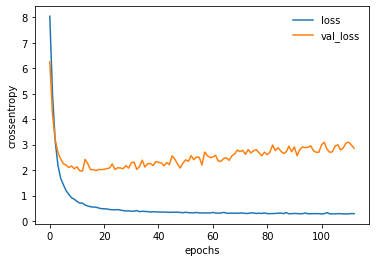

In [ ]:
# グラフの表示
plt.plot(log.history["loss"], label="loss")
plt.plot(log.history["val_loss"], label="val_loss")
plt.legend(frameon=False)
plt.xlabel("epochs")
plt.ylabel("crossentropy")
plt.show()

過学習がだいぶましになった。

In [ ]:
# テストデータによる評価まで実施する
Y_pred_0 = model.predict(X_test)

# 予測結果の各リストにおける妻財地のインデックスを取得
Y_pred = np.argmax(Y_pred_0, axis=1)

32/32 [==============================] - 0s 5ms/step


In [ ]:
# カテゴリー変数の復元
Y_test_ = np.argmax(Y_test, axis=1)

In [ ]:
# モデルの評価
print(classification_report(Y_test_, Y_pred))

              precision    recall  f1-score   support

           0       0.51      0.57      0.54       157
           1       0.50      0.51      0.51       143
           2       0.60      0.25      0.35        36
           3       0.71      0.64      0.67       220
           4       0.42      0.42      0.42        77
           5       0.62      0.61      0.62        75
           6       0.63      0.68      0.65       275
           7       0.33      0.25      0.29         4
           8       0.50      0.70      0.58        10

    accuracy                           0.59       997
   macro avg       0.54      0.51      0.51       997
weighted avg       0.59      0.59      0.58       997



#### ≪結果≫
- ベースラインよりわずかに精度が上がったが、過学習は以前みられる。  
- 層を増やしてモデルを複雑化することで、精度の向上が見込めるかもしれない。  
- また、過学習に対してはL1 or L2正則化を入れることにより解消できる可能性がある。  
- まだ改善の余地があるものの、一旦、特徴量抽出としてTF-IDF方式も試してみて、Bag of Words方式とどれくらい精度に違いがあるか確認することとした。

## 【TF-IDF】

#### １．形態素解析用の関数を作成

In [ ]:
# 形態素解析用の関数の作成
# 文章データは英文で元々スペースで区切られているため、不要なワードや記号を除去するのみ
def clean_text(text_data):
    # ノイズの除去
    for ch in ".,:;°!?+*/=|()[]{}<>~^#$@%&'\"_":
        text_data = text_data.replace(ch, " ")

    # 形態素解析：スペースで分割
    results = [x.strip() for x in text_data.split()]

    # 小文字化（表記の揺れを補正）
    results = [result.lower() for result in results]
    
    stop_words = ['fig', 'figs', 'however', 'whereas', 'another', 'either', 'yet', 'known', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves',\
            'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',\
            'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'whose', 'this', 'that',\
            "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', \
            'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'thus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into',\
            'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such',\
            'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'could', 'will', 'would', 'may', 'might', 'must', 'just', 'don', "don't", 'should', "should've",\
            'now', 'd', 'll', 'm', 'o', 're', 've', 'y', 'ain', 'aren', "aren't", 'cannot', 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't",\
            'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn',\
            "shouldn't", 'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"]

    # 分析対象外のワードを除去
    words = []
    for word in results:
        if len(word) < 3:
            # 2文字以下のワード
            continue

        elif re.match(r"^[0-9!-/:-@¥[-`{-~–·•]+$", word):
            # 数字や記号だけで構成されたワード(ASCIIコード表の記号と–·•を指定)
            continue

        elif re.match(r"^[0-9]+.*$", word):
            # 数字からはじまるワード
            continue

        elif word in stop_words:
            # stop_wordsに該当するもの
            continue
        
        words.append(word)

    # TF-IDF用にリストwordsに残ったワードをスペースで結合して返す
    return " ".join(words)

In [ ]:
# １番目のデータ（ID: 0)で確認
with open("/content/drive/MyDrive/Colab Notebooks/Personalized Medicine/training_text", "r") as f:
    text_data = f.readlines()
    # 見出しの行はカット
    text_data.pop(0)

clean_text(text_data[0])

'cyclin-dependent kinases cdks regulate variety fundamental cellular processes cdk10 stands one last orphan cdks activating cyclin identified kinase activity revealed previous work shown cdk10 silencing increases ets2 v-ets erythroblastosis virus e26 oncogene homolog -driven activation mapk pathway confers tamoxifen resistance breast cancer cells precise mechanisms cdk10 modulates ets2 activity generally functions cdk10 remain elusive demonstrate cdk10 cyclin-dependent kinase identifying cyclin activating cyclin cyclin orphan cyclin product fam58a mutations cause star syndrome human developmental anomaly features include toe syndactyly telecanthus anogenital renal malformations show star syndrome-associated cyclin mutants unable interact cdk10 cyclin silencing phenocopies cdk10 silencing increasing c-raf conferring tamoxifen resistance breast cancer cells cdk10 cyclin phosphorylates ets2 vitro cells positively controls ets2 degradation proteasome ets2 protein levels increased cells der

In [ ]:
# 全文章データに対して clean_text を適用し、結果を１つずつリストcelan_text_dataに格納
with open("/content/drive/MyDrive/Colab Notebooks/Personalized Medicine/training_text", "r") as f:
    text_data = f.readlines()
    # 見出しの行はカット
    text_data.pop(0)  

# 形態素解析の結果を格納するリスト
clean_text_data = []
# text_dataに含まれるすべての文章データに対して実施
for text in text_data:
    doc = clean_text(text)
    clean_text_data.append(doc)

In [ ]:
# 形状を確認
print(len(clean_text_data))

3321


#### ２．TF-IDF値の計算

In [ ]:
# ライブラリをインポート
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
# celan_text_data内の文章のTF-IDF値を計算する
# Vectorizerの作成
# デフォルトの区切り文字には\b（単語の境界）や\w（アルファベット、アンダーバー、数字）が含まれるため、
# （任意の1文字以上の文字列）+半角スペースをトークンパターンとして設定。(?u)はUnicode (UTF-8) を示す
# 文書全体の50%以上で出現する単語は無視することとした(max_df = 0.5)
vectorizer = TfidfVectorizer(token_pattern='(?u)(.+?) ', lowercase=False, smooth_idf=False, max_df = 0.5)
X = vectorizer.fit_transform(clean_text_data)

In [ ]:
# 形状を確認
print("type:", type(X))
print("shape:", X.shape)

type: <class 'scipy.sparse.csr.csr_matrix'>
shape: (3321, 194655)


- 194655個のワードが抽出された（少し多すぎる）。    
- Bag of Words方式と特徴量の数を合わせ、TF-IDF値の高い上位48000語程度を抽出することで両者を比較できるか。  
- しかし今回は、ディープラーニングモデルで、層を増やすことも検討したいので、処理時間等も考慮し、TF-IDF値の高い上位10000ワードに限定して検討することとした。

In [ ]:
# Vectorizerの作成
# デフォルトの区切り文字には\b（単語の境界）や\w（アルファベット、アンダーバー、数字）が含まれるため、
# （任意の1文字以上の文字列）+半角スペースをトークンパターンとして設定。(?u)はUnicode (UTF-8) を示す
# celan_text_data内の文章のTF-IDF値を計算する
# max_featuresでTF-IDF値を表示する単語数を指定する（TF-IDF値が高い順に取得）。
vectorizer = TfidfVectorizer(token_pattern='(?u)(.+?) ', lowercase=False, smooth_idf=False, max_features = 10000)
X = vectorizer.fit_transform(clean_text_data)

In [ ]:
# 形状を確認
print("type:", type(X))
print("shape:", X.shape)

type: <class 'scipy.sparse.csr.csr_matrix'>
shape: (3321, 10000)


全文章データの中でTF-IDF値の高い10000ワードを抽出した。  

In [ ]:
# 各列に対応したワードを取得
feature_names = vectorizer.get_feature_names()
feature_names

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['-2hg',
 '-catenin',
 '-defi',
 '-dependent',
 '-independent',
 '-mediated',
 '-null',
 '-tkd',
 'a-gvgd',
 'a-loop',
 'a-raf',
 'a-t',
 'a121v',
 'a1459p',
 'a146',
 'a146t',
 'a148t',
 'a159t',
 'a159v',
 'a1708e',
 'a1752p',
 'a20',
 'a266',
 'a375',
 'a549',
 'a614d',
 'a648t',
 'a750',
 'a763',
 'aaa',
 'aac',
 'aacr',
 'aacrjournals',
 'aag',
 'abbott',
 'abbreviations',
 'abc',
 'abc-dlbcl',
 'abcam',
 'abcb7',
 'abd',
 'abdomen',
 'abdominal',
 'abd–rbd',
 'aberrant',
 'aberrantly',
 'aberration',
 'aberrations',
 'abi',
 'abilities',
 'ability',
 'abl',
 'abl1',
 'ablates',
 'ablation',
 'able',
 'abnormal',
 'abnormalities',
 'abnormality',
 'abnormally',
 'abolish',
 'abolished',
 'abolishes',
 'abolishing',
 'above-mentioned',
 'abraxas',
 'abrogate',
 'abrogated',
 'abrogates',
 'abrogating',
 'abrogation',
 'absence',
 'absent',
 'absolute',
 'absolutely',
 'absorbance',
 'abstract',
 'abstract•',
 'abundance',
 'abundant',
 'aca',
 'academic',
 'acc',
 'accelerate',
 'a

In [ ]:
# TF-IDF値
values = X.toarray()
print(type(values))

<class 'numpy.ndarray'>


In [ ]:
# DataFrameに表示
tfidf_df = pd.DataFrame(values, columns = feature_names)
tfidf_df.head()

,-2hg,-catenin,-defi,-dependent,-independent,-mediated,-null,-tkd,a-gvgd,a-loop,a-raf,a-t,a121v,a1459p,a146,a146t,a148t,a159t,a159v,a1708e,a1752p,a20,a266,a375,a549,a614d,a648t,a750,a763,aaa,aac,aacr,aacrjournals,aag,abbott,abbreviations,abc,abc-dlbcl,abcam,abcb7,abd,abdomen,abdominal,abd–rbd,aberrant,aberrantly,aberration,aberrations,abi,abilities,ability,abl,abl1,ablates,ablation,able,abnormal,abnormalities,abnormality,abnormally,abolish,abolished,abolishes,abolishing,above-mentioned,abraxas,abrogate,abrogated,abrogates,abrogating,abrogation,absence,absent,absolute,absolutely,absorbance,abstract,abstract•,abundance,abundant,aca,academic,acc,accelerate,accelerated,accepted,acceptor,access,accessed,accessibility,accessible,accession,accommodate,accompanied,accompanying,accomplished,accord,accordance,according,accordingly,account,accounted,accounting,accounts,accrual,accumulate,accumulated,accumulates,accumulating,accumulation,accuracy,accurate,accurately,acetate,acetic,acetylated,acetylation,acetyltransferase,acg,acgh,achievable,achieve,achieved,achievement,achieves,achieving,achondroplasia,acid,acidic,acids,acinar,acini,acknowledgments•,acml,acquire,acquired,acquisition,acral,across,act,actin,acting,action,actionable,actions,activate,activated,activates,activating,activation,activation-loop,activator,activators,active,active-site,actively,activin,activities,activity,acts,actual,actually,acute,acvr1,adaptation,adapted,adapter,adaptive,adaptor,adaptors,adc,add,added,addgene,addicted,addiction,adding,addition,additional,additionally,additive,address,addressed,adds,ade2,adenine,adeno,adenocarcinoma,adenocarcinomas,adenoma,adenomas,adenomatous,adenosine,adenosquamous,adenovirus,adequate,adequately,adherent,adhesion,adipocytes,adjacent,adjusted,adjustment,adjustments,adjuvant,administered,administration,adolescents,adopt,adopted,adoption,adopts,adp,adrenal,adrenocortical,adriamycin,adult,adults,advance,advanced,advances,advantage,advantageous,advantages,advent,adverse,advertisement,aee788,aes,afatinib,affect,affected,affecting,affects,affinities,affinity,affymetrix,aforementioned,african,aga,agar,agarose,agc,age,aged,agency,agent,agents,ages,agg,aggregate,aggregated,aggregates,aggregating,aggregation,aggressive,aggressiveness,agilent,aging,ago,ago2,agonist,agonists,agree,agreed,agreement,ags,agvgd,ahead,ahmadian,aid,aim,aimed,aims,ais,aitl,akap9,akap9-braf,akt,akt-3,akt1,akt2,akt3,akti,ala,ala-scanning,ala57val,ala60arg,ala60val,ala767,alamut,alanine,albeit,alberta,albumin,alcl,alcohol,alectinib,alexa,algorithm,algorithms,align,align-gvgd,aligned,alignment,alignments,aliphatic,aliquot,aliquots,alive,alk,alk-mutated,alk-positive,alk-rearranged,alk-targeted,alk5,alka1099t,alka1234t,alkaline,alkd1091n,alkf1174i,alkf1174l,alkm1166r,alkr1464stop,alkt1087i,alkt1151m,alkylating,alk−,allele,allele-specific,alleles,allelic,allocated,allogeneic,allosteric,allow,allowed,allowing,allows,almost,alone,along,alongside,alp,alpha,already,also,alt,alter,alteration,alterations,altered,altering,alternate,alternating,alternative,alternatively,alters,although,alto,altogether,alvaro,alveolar,always,amaxa,ambiguous,ambion,ambivalent,amenable,america,american,amersham,amide,amino,amino-acid,amino-terminal,aminoacid,aml,aml-m2,aml1,aml1-d171n,amls,ammonium,amol,among,amongst,amount,amounts,amp,ampk,amplicon,amplicons,amplification,amplifications,amplified,amplify,ampli®cation,amsterdam,amyloid,anal,analog,analogous,analogue,analogues,analogy,analyse,analysed,analyses,analysis,analytical,analyze,analyzed,analyzer,analyzing,anaplastic,anatomic,anatomical,ancestry,anchor,anchorage,anchorage-independent,and2,and3,anderson,androgen,androgens,anemia,aneuploidy,angiogenesis,angiogenic,angiomatoid,angle,angles,animal,animals,ankyrin,ann,annealed,annealing,annexin,annotated,annotation,annual,annually,anomalies,anomalous,anomaly,anova,antagonist,antagonists,antagonize,anterior,anti-actin,anti-akt,anti-alk,anti-apoptotic,anti-cancer,anti-cdk6,anti-cyclin,anti-egfr,ant

In [ ]:
# 形状を確認
tfidf_df.shape

(3321, 10000)

#### ３．モデルの作成

#### ３－１．ロジスティック回帰モデル

抽出した10000ワードのTF-IDF値に加え、ここからは遺伝子名も説明変数として加えることにした。

In [ ]:
# 説明変数に遺伝子名を入れたいので、これをカテゴリー変数化する
var_data2_ = pd.get_dummies(data=var_data, columns=['Gene'])
var_data2_.head()

,ID,Variation,Class,Gene_ABL1,Gene_ACVR1,Gene_AGO2,Gene_AKT1,Gene_AKT2,Gene_AKT3,Gene_ALK,Gene_APC,Gene_AR,Gene_ARAF,Gene_ARID1A,Gene_ARID1B,Gene_ARID2,Gene_ARID5B,Gene_ASXL1,Gene_ASXL2,Gene_ATM,Gene_ATR,Gene_ATRX,Gene_AURKA,Gene_AURKB,Gene_AXIN1,Gene_AXL,Gene_B2M,Gene_BAP1,Gene_BARD1,Gene_BCL10,Gene_BCL2,Gene_BCL2L11,Gene_BCOR,Gene_BRAF,Gene_BRCA1,Gene_BRCA2,Gene_BRD4,Gene_BRIP1,Gene_BTK,Gene_CARD11,Gene_CARM1,Gene_CASP8,Gene_CBL,Gene_CCND1,Gene_CCND2,Gene_CCND3,Gene_CCNE1,Gene_CDH1,Gene_CDK12,Gene_CDK4,Gene_CDK6,Gene_CDK8,Gene_CDKN1A,Gene_CDKN1B,Gene_CDKN2A,Gene_CDKN2B,Gene_CDKN2C,Gene_CEBPA,Gene_CHEK2,Gene_CIC,Gene_CREBBP,Gene_CTCF,Gene_CTLA4,Gene_CTNNB1,Gene_DDR2,Gene_DICER1,Gene_DNMT3A,Gene_DNMT3B,Gene_DUSP4,Gene_EGFR,Gene_EIF1AX,Gene_ELF3,Gene_EP300,Gene_EPAS1,Gene_EPCAM,Gene_ERBB2,Gene_ERBB3,Gene_ERBB4,Gene_ERCC2,Gene_ERCC3,Gene_ERCC4,Gene_ERG,Gene_ERRFI1,Gene_ESR1,Gene_ETV1,Gene_ETV6,Gene_EWSR1,Gene_EZH2,Gene_FAM58A,Gene_FANCA,Gene_FANCC,Gene_FAT1,Gene_FBXW7,Gene_FGF19,Gene_FGF3,Gene_FGF4,Gene_FGFR1,Gene_FGFR2,Gene_FGFR3,Gene_FGFR4,Gene_FLT1,Gene_FLT3,Gene_FOXA1,Gene_FOXL2,Gene_FOXO1,Gene_FOXP1,Gene_FUBP1,Gene_GATA3,Gene_GLI1,Gene_GNA11,Gene_GNAQ,Gene_GNAS,Gene_H3F3A,Gene_HIST1H1C,Gene_HLA-A,Gene_HLA-B,Gene_HNF1A,Gene_HRAS,Gene_IDH1,Gene_IDH2,Gene_IGF1R,Gene_IKBKE,Gene_IKZF1,Gene_IL7R,Gene_INPP4B,Gene_JAK1,Gene_JAK2,Gene_JUN,Gene_KDM5A,Gene_KDM5C,Gene_KDM6A,Gene_KDR,Gene_KEAP1,Gene_KIT,Gene_KLF4,Gene_KMT2A,Gene_KMT2B,Gene_KMT2C,Gene_KMT2D,Gene_KNSTRN,Gene_KRAS,Gene_LATS1,Gene_LATS2,Gene_MAP2K1,Gene_MAP2K2,Gene_MAP2K4,Gene_MAP3K1,Gene_MAPK1,Gene_MDM2,Gene_MDM4,Gene_MED12,Gene_MEF2B,Gene_MEN1,Gene_MET,Gene_MGA,Gene_MLH1,Gene_MPL,Gene_MSH2,Gene_MSH6,Gene_MTOR,Gene_MYC,Gene_MYCN,Gene_MYD88,Gene_MYOD1,Gene_NCOR1,Gene_NF1,Gene_NF2,Gene_NFE2L2,Gene_NFKBIA,Gene_NKX2-1,Gene_NOTCH1,Gene_NOTCH2,Gene_NPM1,Gene_NRAS,Gene_NSD1,Gene_NTRK1,Gene_NTRK2,Gene_NTRK3,Gene_NUP93,Gene_PAK1,Gene_PAX8,Gene_PBRM1,Gene_PDGFRA,Gene_PDGFRB,Gene_PIK3CA,Gene_PIK3CB,Gene_PIK3CD,Gene_PIK3R1,Gene_PIK3R2,Gene_PIK3R3,Gene_PIM1,Gene_PMS1,Gene_PMS2,Gene_POLE,Gene_PPM1D,Gene_PPP2R1A,Gene_PPP6C,Gene_PRDM1,Gene_PTCH1,Gene_PTEN,Gene_PTPN11,Gene_PTPRD,Gene_PTPRT,Gene_RAB35,Gene_RAC1,Gene_RAD21,Gene_RAD50,Gene_RAD51B,Gene_RAD51C,Gene_RAD51D,Gene_RAD54L,Gene_RAF1,Gene_RARA,Gene_RASA1,Gene_RB1,Gene_RBM10,Gene_RET,Gene_RHEB,Gene_RHOA,Gene_RICTOR,Gene_RIT1,Gene_RNF43,Gene_ROS1,Gene_RRAS2,Gene_RUNX1,Gene_RXRA,Gene_RYBP,Gene_SDHB,Gene_SDHC,Gene_SETD2,Gene_SF3B1,Gene_SHOC2,Gene_SHQ1,Gene_SMAD2,Gene_SMAD3,Gene_SMAD4,Gene_SMARCA4,Gene_SMARCB1,Gene_SMO,Gene_SOS1,Gene_SOX9,Gene_SPOP,Gene_SRC,Gene_SRSF2,Gene_STAG2,Gene_STAT3,Gene_STK11,Gene_TCF3,Gene_TCF7L2,Gene_TERT,Gene_TET1,Gene_TET2,Gene_TGFBR1,Gene_TGFBR2,Gene_TMPRSS2,Gene_TP53,Gene_TP53BP1,Gene_TSC1,Gene_TSC2,Gene_U2AF1,Gene_VEGFA,Gene_VHL,Gene_WHSC1,Gene_WHSC1L1,Gene_XPO1,Gene_XRCC2,Gene_YAP1
0,0,Truncating Mutations,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,W802*,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2,Q249E,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [ ]:
# 文章データから抽出した10000ワード分のTF-IDF値のDataFrameを結合する
var_data2 = pd.concat([var_data2_, tfidf_df], axis=1)
var_data2.head()

,ID,Variation,Class,Gene_ABL1,Gene_ACVR1,Gene_AGO2,Gene_AKT1,Gene_AKT2,Gene_AKT3,Gene_ALK,Gene_APC,Gene_AR,Gene_ARAF,Gene_ARID1A,Gene_ARID1B,Gene_ARID2,Gene_ARID5B,Gene_ASXL1,Gene_ASXL2,Gene_ATM,Gene_ATR,Gene_ATRX,Gene_AURKA,Gene_AURKB,Gene_AXIN1,Gene_AXL,Gene_B2M,Gene_BAP1,Gene_BARD1,Gene_BCL10,Gene_BCL2,Gene_BCL2L11,Gene_BCOR,Gene_BRAF,Gene_BRCA1,Gene_BRCA2,Gene_BRD4,Gene_BRIP1,Gene_BTK,Gene_CARD11,Gene_CARM1,Gene_CASP8,Gene_CBL,Gene_CCND1,Gene_CCND2,Gene_CCND3,Gene_CCNE1,Gene_CDH1,Gene_CDK12,Gene_CDK4,Gene_CDK6,Gene_CDK8,Gene_CDKN1A,Gene_CDKN1B,Gene_CDKN2A,Gene_CDKN2B,Gene_CDKN2C,Gene_CEBPA,Gene_CHEK2,Gene_CIC,Gene_CREBBP,Gene_CTCF,Gene_CTLA4,Gene_CTNNB1,Gene_DDR2,Gene_DICER1,Gene_DNMT3A,Gene_DNMT3B,Gene_DUSP4,Gene_EGFR,Gene_EIF1AX,Gene_ELF3,Gene_EP300,Gene_EPAS1,Gene_EPCAM,Gene_ERBB2,Gene_ERBB3,Gene_ERBB4,Gene_ERCC2,Gene_ERCC3,Gene_ERCC4,Gene_ERG,Gene_ERRFI1,Gene_ESR1,Gene_ETV1,Gene_ETV6,Gene_EWSR1,Gene_EZH2,Gene_FAM58A,Gene_FANCA,Gene_FANCC,Gene_FAT1,Gene_FBXW7,Gene_FGF19,Gene_FGF3,Gene_FGF4,Gene_FGFR1,Gene_FGFR2,Gene_FGFR3,Gene_FGFR4,Gene_FLT1,Gene_FLT3,Gene_FOXA1,Gene_FOXL2,Gene_FOXO1,Gene_FOXP1,Gene_FUBP1,Gene_GATA3,Gene_GLI1,Gene_GNA11,Gene_GNAQ,Gene_GNAS,Gene_H3F3A,Gene_HIST1H1C,Gene_HLA-A,Gene_HLA-B,Gene_HNF1A,Gene_HRAS,Gene_IDH1,Gene_IDH2,Gene_IGF1R,Gene_IKBKE,Gene_IKZF1,Gene_IL7R,Gene_INPP4B,Gene_JAK1,Gene_JAK2,Gene_JUN,Gene_KDM5A,Gene_KDM5C,Gene_KDM6A,Gene_KDR,Gene_KEAP1,Gene_KIT,Gene_KLF4,Gene_KMT2A,Gene_KMT2B,Gene_KMT2C,Gene_KMT2D,Gene_KNSTRN,Gene_KRAS,Gene_LATS1,Gene_LATS2,Gene_MAP2K1,Gene_MAP2K2,Gene_MAP2K4,Gene_MAP3K1,Gene_MAPK1,Gene_MDM2,Gene_MDM4,Gene_MED12,Gene_MEF2B,Gene_MEN1,Gene_MET,Gene_MGA,Gene_MLH1,Gene_MPL,Gene_MSH2,Gene_MSH6,Gene_MTOR,Gene_MYC,Gene_MYCN,Gene_MYD88,Gene_MYOD1,Gene_NCOR1,Gene_NF1,Gene_NF2,Gene_NFE2L2,Gene_NFKBIA,Gene_NKX2-1,Gene_NOTCH1,Gene_NOTCH2,Gene_NPM1,Gene_NRAS,Gene_NSD1,Gene_NTRK1,Gene_NTRK2,Gene_NTRK3,Gene_NUP93,Gene_PAK1,Gene_PAX8,Gene_PBRM1,Gene_PDGFRA,Gene_PDGFRB,Gene_PIK3CA,Gene_PIK3CB,Gene_PIK3CD,Gene_PIK3R1,Gene_PIK3R2,Gene_PIK3R3,Gene_PIM1,Gene_PMS1,Gene_PMS2,Gene_POLE,Gene_PPM1D,Gene_PPP2R1A,Gene_PPP6C,Gene_PRDM1,Gene_PTCH1,Gene_PTEN,Gene_PTPN11,Gene_PTPRD,Gene_PTPRT,Gene_RAB35,Gene_RAC1,Gene_RAD21,Gene_RAD50,Gene_RAD51B,Gene_RAD51C,Gene_RAD51D,Gene_RAD54L,Gene_RAF1,Gene_RARA,Gene_RASA1,Gene_RB1,Gene_RBM10,Gene_RET,Gene_RHEB,Gene_RHOA,Gene_RICTOR,Gene_RIT1,Gene_RNF43,Gene_ROS1,Gene_RRAS2,Gene_RUNX1,Gene_RXRA,Gene_RYBP,Gene_SDHB,Gene_SDHC,Gene_SETD2,Gene_SF3B1,Gene_SHOC2,Gene_SHQ1,Gene_SMAD2,Gene_SMAD3,Gene_SMAD4,Gene_SMARCA4,Gene_SMARCB1,Gene_SMO,Gene_SOS1,Gene_SOX9,Gene_SPOP,Gene_SRC,Gene_SRSF2,Gene_STAG2,Gene_STAT3,Gene_STK11,Gene_TCF3,Gene_TCF7L2,Gene_TERT,Gene_TET1,Gene_TET2,Gene_TGFBR1,Gene_TGFBR2,Gene_TMPRSS2,Gene_TP53,Gene_TP53BP1,Gene_TSC1,Gene_TSC2,Gene_U2AF1,Gene_VEGFA,Gene_VHL,Gene_WHSC1,Gene_WHSC1L1,Gene_XPO1,Gene_XRCC2,Gene_YAP1,-2hg,-catenin,-defi,-dependent,-independent,-mediated,-null,-tkd,a-gvgd,a-loop,a-raf,a-t,a121v,a1459p,a146,a146t,a148t,a159t,a159v,a1708e,a1752p,a20,a266,a375,a549,a614d,a648t,a750,a763,aaa,aac,aacr,aacrjournals,aag,abbott,abbreviations,abc,abc-dlbcl,abcam,abcb7,abd,abdomen,abdominal,abd–rbd,aberrant,aberrantly,aberration,aberrations,abi,abilities,ability,abl,abl1,ablates,ablation,able,abnormal,abnormalities,abnormality,abnormally,abolish,abolished,abolishes,abolishing,above-mentioned,abraxas,abrogate,abrogated,abrogates,abrogating,abrogation,absence,absent,absolute,absolutely,absorbance,abstract,abstract•,abundance,abundant,aca,academic,acc,accelerate,accelerated,accepted,acceptor,access,accessed,accessibility,accessible,accession,accommodate,accompanied,accompanying,accomplished,accord,accordance,according,accordingly,account,accounted,accounting,accounts,accrual,accumulate,accumulated,accumulates,accumulating,accumulation,accuracy,accurate,accurately,acetate,acetic,acetylated,acetylation,acetyltransferase,acg,acgh,achievable,achieve,achieved,achievement,achieves,achieving,achondroplasia,acid,acidic,acids,acinar,acini,acknowled

In [ ]:
# 説明変数(X)：10000ワード分のTF-IDF値と264種類の遺伝子名
X = np.array(var_data2.iloc[:, 3:])

In [ ]:
# 目的変数(Y)：Class1~Class9
Y = np.array(var_data["Class"])

In [ ]:
# データの分割
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
X_train, X_valid, Y_train, Y_valid = train_test_split(X_train, Y_train, test_size=0.3, random_state=0)

In [ ]:
# 形状を確認
print("Y_train=", Y_train.shape, ", X_train=", X_train.shape)
print("Y_valid=", Y_valid.shape, ", X_valid=", X_valid.shape)
print("Y_test=", Y_test.shape, ", X_test=", X_test.shape)

Y_train= (1626,) , X_train= (1626, 10264)
Y_valid= (698,) , X_valid= (698, 10264)
Y_test= (997,) , X_test= (997, 10264)


In [ ]:
logistic_model = LogisticRegression(solver='lbfgs', multi_class='multinomial')
# 学習
logistic_model.fit(X_train, Y_train)
# 予測
Y_pred = logistic_model.predict(X_valid)

In [ ]:
# モデルの評価
print(classification_report(Y_valid, Y_pred))

              precision    recall  f1-score   support

           1       0.54      0.60      0.57       127
           2       0.45      0.37      0.41        67
           3       0.00      0.00      0.00        18
           4       0.64      0.63      0.64       145
           5       0.47      0.26      0.33        54
           6       0.71      0.64      0.67        64
           7       0.69      0.88      0.77       210
           8       0.00      0.00      0.00         4
           9       1.00      0.44      0.62         9

    accuracy                           0.62       698
   macro avg       0.50      0.43      0.45       698
weighted avg       0.60      0.62      0.60       698



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### ≪結果≫  
Bag of Words方式とf1値の平均は同じ値だが、出現率の低いClass8とClass3が全く予測できておらず、その点でBag of Words方式よりも悪いモデルになった。

#### ３－２．ディープラーニングモデル

In [ ]:
# 目的変数(Class1～9)をカテゴリー変数化する
var_data3 = pd.get_dummies(data=var_data, columns=['Class'])
var_data3.head()

,ID,Gene,Variation,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9
0,0,FAM58A,Truncating Mutations,1,0,0,0,0,0,0,0,0
1,1,CBL,W802*,0,1,0,0,0,0,0,0,0
2,2,CBL,Q249E,0,1,0,0,0,0,0,0,0
3,3,CBL,N454D,0,0,1,0,0,0,0,0,0
4,4,CBL,L399V,0,0,0,1,0,0,0,0,0


In [ ]:
# 目的変数(Y)：Class1~Class9をカテゴリー変数化したもの
Y = np.array(var_data3.loc[:, "Class_1":"Class_9"])

In [ ]:
# 説明変数(X)：ロジスティック回帰モデルと同じ
# 形状を確認
print("Y:", Y.shape, ", X:", X.shape)

Y: (3321, 9) , X: (3321, 10264)


In [ ]:
# データの分割
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
X_train, X_valid, Y_train, Y_valid = train_test_split(X_train, Y_train, test_size=0.3, random_state=0)

In [ ]:
# 形状を確認
print("Y_train=", Y_train.shape, ", X_train=", X_train.shape)
print("Y_valid=", Y_valid.shape, ", X_valid=", X_valid.shape)
print("Y_test=", Y_test.shape, ", X_test=", X_test.shape)

Y_train= (1626, 9) , X_train= (1626, 10264)
Y_valid= (698, 9) , X_valid= (698, 10264)
Y_test= (997, 9) , X_test= (997, 10264)


In [ ]:
# モデルの初期化
model = keras.Sequential()

# 入力層
model.add(Dense(1024, activation='relu', input_shape=(10264, )))
# 隠れ層
model.add(Dense(256, activation='relu'))
# 隠れ層
model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.01)))
# 出力層
model.add(Dense(9, activation='softmax'))

# モデルの構築
model.compile(optimizer="rmsprop", loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
# モデルの構造を表示
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_20 (Dense)            (None, 1024)              10511360  
                                                                 
 dense_21 (Dense)            (None, 256)               262400    
                                                                 
 dense_22 (Dense)            (None, 64)                16448     
                                                                 
 dense_23 (Dense)            (None, 9)                 585       
                                                                 
Total params: 10,790,793
Trainable params: 10,790,793
Non-trainable params: 0
_________________________________________________________________


In [ ]:
%%time
# 学習の実施
log = model.fit(X_train, Y_train, epochs=1000, batch_size=32, verbose=True, callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=100, verbose=1)], validation_data=(X_valid, Y_valid))

Epoch 1/1000
51/51 [==============================] - 1s 13ms/step - loss: 8.4202 - accuracy: 0.4637 - val_loss: 5.3646 - val_accuracy: 0.6060
Epoch 2/1000
51/51 [==============================] - 0s 9ms/step - loss: 3.6274 - accuracy: 0.6390 - val_loss: 2.4852 - val_accuracy: 0.6060
Epoch 3/1000
51/51 [==============================] - 0s 9ms/step - loss: 1.7697 - accuracy: 0.7177 - val_loss: 1.8342 - val_accuracy: 0.5874
Epoch 4/1000
51/51 [==============================] - 0s 9ms/step - loss: 1.3176 - accuracy: 0.7368 - val_loss: 1.6117 - val_accuracy: 0.6032
Epoch 5/1000
51/51 [==============================] - 0s 9ms/step - loss: 1.1053 - accuracy: 0.7841 - val_loss: 1.4703 - val_accuracy: 0.6175
Epoch 6/1000
51/51 [==============================] - 0s 9ms/step - loss: 0.9551 - accuracy: 0.8007 - val_loss: 1.4948 - val_accuracy: 0.6418
Epoch 7/1000
51/51 [==============================] - 0s 8ms/step - loss: 0.8696 - accuracy: 0.8155 - val_loss: 1.5887 - val_accuracy: 0.5989
Epoch

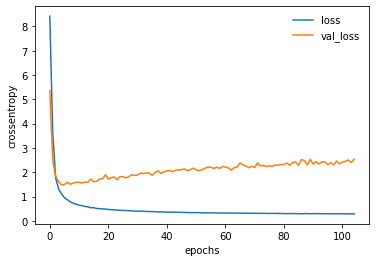

In [ ]:
# グラフの表示
plt.plot(log.history["loss"], label="loss")
plt.plot(log.history["val_loss"], label="val_loss")
plt.legend(frameon=False)
plt.xlabel("epochs")
plt.ylabel("crossentropy")
plt.show()

隠れ層を2層に増やし、L1正則化（罰則化項：0.01）を入れたが、過学習の改善は不十分である。  
一方で、Bag of Words方式で行ったディープラーニングのモデル（loss:0.27, accuracy:0.91, val_loss:3.66, val_accuracy:0.58)より、validationデータへの当てはまりはわずかに良い傾向が見られる。

In [ ]:
# テストデータによる評価まで実施する
Y_pred_0 = model.predict(X_test)

# 予測結果の各リストにおける妻財地のインデックスを取得
Y_pred = np.argmax(Y_pred_0, axis=1)

32/32 [==============================] - 0s 2ms/step


In [ ]:
# カテゴリー変数の復元
Y_test_ = np.argmax(Y_test, axis=1)

In [ ]:
# モデルの評価
print(classification_report(Y_test_, Y_pred))

              precision    recall  f1-score   support

           0       0.56      0.58      0.57       157
           1       0.49      0.44      0.46       143
           2       0.50      0.36      0.42        36
           3       0.71      0.78      0.74       220
           4       0.46      0.31      0.37        77
           5       0.64      0.64      0.64        75
           6       0.66      0.71      0.68       275
           7       0.33      0.25      0.29         4
           8       0.64      0.70      0.67        10

    accuracy                           0.62       997
   macro avg       0.55      0.53      0.54       997
weighted avg       0.61      0.62      0.61       997



#### ≪結果≫  
- Bag of Words方式のディープラーニングモデルよりも、わずかにf1値の平均値が高い値になったが、大幅な精度向上にはつながらなかった。  
- 過学習が依然解消されていないため、以下L2正則化や罰則化項の値の検討を行った。

#### ３－３．ディープラーニングモデル  
L2正則化に変更

In [ ]:
# モデルの初期化
model = keras.Sequential()

# 入力層
model.add(Dense(1024, activation='relu', input_shape=(10264, )))
# 隠れ層
model.add(Dense(256, activation='relu'))
# 隠れ層
model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
# 出力層
model.add(Dense(9, activation='softmax'))

# モデルの構築
model.compile(optimizer="rmsprop", loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
# モデルの構造を表示
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_16 (Dense)            (None, 1024)              10511360  
                                                                 
 dense_17 (Dense)            (None, 256)               262400    
                                                                 
 dense_18 (Dense)            (None, 64)                16448     
                                                                 
 dense_19 (Dense)            (None, 9)                 585       
                                                                 
Total params: 10,790,793
Trainable params: 10,790,793
Non-trainable params: 0
_________________________________________________________________


In [ ]:
%%time
# 学習の実施
log = model.fit(X_train, Y_train, epochs=1000, batch_size=32, verbose=True, callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=100, verbose=1)], validation_data=(X_valid, Y_valid))

Epoch 1/1000
51/51 [==============================] - 1s 13ms/step - loss: 2.0649 - accuracy: 0.4803 - val_loss: 1.5699 - val_accuracy: 0.6060
Epoch 2/1000
51/51 [==============================] - 1s 11ms/step - loss: 1.2741 - accuracy: 0.6581 - val_loss: 1.4097 - val_accuracy: 0.5759
Epoch 3/1000
51/51 [==============================] - 0s 9ms/step - loss: 0.9564 - accuracy: 0.7528 - val_loss: 1.2661 - val_accuracy: 0.6433
Epoch 4/1000
51/51 [==============================] - 0s 9ms/step - loss: 0.7868 - accuracy: 0.7774 - val_loss: 1.2742 - val_accuracy: 0.6590
Epoch 5/1000
51/51 [==============================] - 0s 9ms/step - loss: 0.6743 - accuracy: 0.8155 - val_loss: 1.4134 - val_accuracy: 0.6060
Epoch 6/1000
51/51 [==============================] - 0s 9ms/step - loss: 0.5897 - accuracy: 0.8290 - val_loss: 1.3638 - val_accuracy: 0.6160
Epoch 7/1000
51/51 [==============================] - 0s 9ms/step - loss: 0.5289 - accuracy: 0.8530 - val_loss: 1.3919 - val_accuracy: 0.6390
Epoc

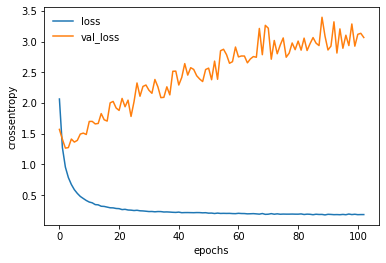

In [ ]:
# グラフの表示
plt.plot(log.history["loss"], label="loss")
plt.plot(log.history["val_loss"], label="val_loss")
plt.legend(frameon=False)
plt.xlabel("epochs")
plt.ylabel("crossentropy")
plt.show()

#### ≪結果≫  
L2正則化では過学習が悪化した。ここではL1正則化のほうが良い選択であると考えられる。  
特徴量が多いので、寄与の小さい成分の重みをバッサリ切ってくれるL1正則化のほうが良いか。

#### ３－４．ディープラーニングモデル  
L1正則化の罰則化項の値をより小さい値に変更

In [ ]:
# モデルの初期化
model = keras.Sequential()

# 入力層
model.add(Dense(1024, activation='relu', input_shape=(10264, )))
# 隠れ層
model.add(Dense(256, activation='relu'))
# 隠れ層
model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.001)))
# 出力層
model.add(Dense(9, activation='softmax'))

# モデルの構築
model.compile(optimizer="rmsprop", loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
# モデルの構造を表示
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 1024)              10511360  
                                                                 
 dense_13 (Dense)            (None, 256)               262400    
                                                                 
 dense_14 (Dense)            (None, 64)                16448     
                                                                 
 dense_15 (Dense)            (None, 9)                 585       
                                                                 
Total params: 10,790,793
Trainable params: 10,790,793
Non-trainable params: 0
_________________________________________________________________


In [ ]:
%%time
# 学習の実施
log = model.fit(X_train, Y_train, epochs=1000, batch_size=32, verbose=True, callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=100, verbose=1)], validation_data=(X_valid, Y_valid))

Epoch 1/1000
51/51 [==============================] - 1s 12ms/step - loss: 2.2275 - accuracy: 0.4502 - val_loss: 1.6696 - val_accuracy: 0.6146
Epoch 2/1000
51/51 [==============================] - 0s 9ms/step - loss: 1.3865 - accuracy: 0.6550 - val_loss: 1.4319 - val_accuracy: 0.6203
Epoch 3/1000
51/51 [==============================] - 0s 9ms/step - loss: 1.0299 - accuracy: 0.7448 - val_loss: 1.4326 - val_accuracy: 0.6332
Epoch 4/1000
51/51 [==============================] - 0s 9ms/step - loss: 0.8670 - accuracy: 0.7897 - val_loss: 1.5026 - val_accuracy: 0.6361
Epoch 5/1000
51/51 [==============================] - 0s 9ms/step - loss: 0.7585 - accuracy: 0.8118 - val_loss: 1.5067 - val_accuracy: 0.6117
Epoch 6/1000
51/51 [==============================] - 0s 9ms/step - loss: 0.6921 - accuracy: 0.8266 - val_loss: 1.4682 - val_accuracy: 0.6447
Epoch 7/1000
51/51 [==============================] - 0s 9ms/step - loss: 0.6214 - accuracy: 0.8456 - val_loss: 1.4958 - val_accuracy: 0.6232
Epoch

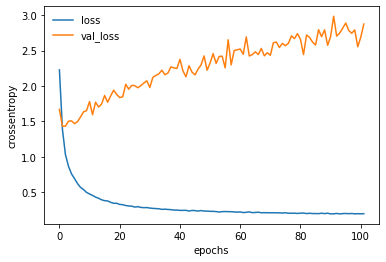

In [ ]:
# グラフの表示
plt.plot(log.history["loss"], label="loss")
plt.plot(log.history["val_loss"], label="val_loss")
plt.legend(frameon=False)
plt.xlabel("epochs")
plt.ylabel("crossentropy")
plt.show()

#### ≪結果≫  
罰則化項が0.001ではペナルティとして弱い。

#### ３－５．ディープラーニングモデル
L1正則化の罰則化項をより大きい値に変更

In [ ]:
# モデルの初期化
model = keras.Sequential()

# 入力層
model.add(Dense(1024, activation='relu', input_shape=(10264, )))
# 隠れ層
model.add(Dense(256, activation='relu'))
# 隠れ層
model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.1)))
# 出力層
model.add(Dense(9, activation='softmax'))

# モデルの構築
model.compile(optimizer="rmsprop", loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
# モデルの構造を表示
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 1024)              10511360  
                                                                 
 dense_25 (Dense)            (None, 256)               262400    
                                                                 
 dense_26 (Dense)            (None, 64)                16448     
                                                                 
 dense_27 (Dense)            (None, 9)                 585       
                                                                 
Total params: 10,790,793
Trainable params: 10,790,793
Non-trainable params: 0
_________________________________________________________________


In [ ]:
%%time
# 学習の実施
log = model.fit(X_train, Y_train, epochs=1000, batch_size=32, verbose=True, callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=100, verbose=1)], validation_data=(X_valid, Y_valid))

Epoch 1/1000
51/51 [==============================] - 1s 13ms/step - loss: 68.7198 - accuracy: 0.4736 - val_loss: 37.5537 - val_accuracy: 0.6032
Epoch 2/1000
51/51 [==============================] - 0s 9ms/step - loss: 19.7819 - accuracy: 0.5904 - val_loss: 6.7183 - val_accuracy: 0.5530
Epoch 3/1000
51/51 [==============================] - 0s 9ms/step - loss: 3.3416 - accuracy: 0.5326 - val_loss: 2.5736 - val_accuracy: 0.4470
Epoch 4/1000
51/51 [==============================] - 0s 9ms/step - loss: 2.2733 - accuracy: 0.5320 - val_loss: 2.2471 - val_accuracy: 0.5458
Epoch 5/1000
51/51 [==============================] - 0s 9ms/step - loss: 2.0977 - accuracy: 0.5978 - val_loss: 2.1998 - val_accuracy: 0.5229
Epoch 6/1000
51/51 [==============================] - 0s 9ms/step - loss: 1.9908 - accuracy: 0.6433 - val_loss: 2.1393 - val_accuracy: 0.5917
Epoch 7/1000
51/51 [==============================] - 0s 9ms/step - loss: 1.8742 - accuracy: 0.6907 - val_loss: 2.1273 - val_accuracy: 0.5989
Ep

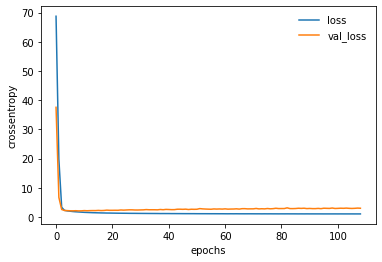

In [ ]:
# グラフの表示
plt.plot(log.history["loss"], label="loss")
plt.plot(log.history["val_loss"], label="val_loss")
plt.legend(frameon=False)
plt.xlabel("epochs")
plt.ylabel("crossentropy")
plt.show()

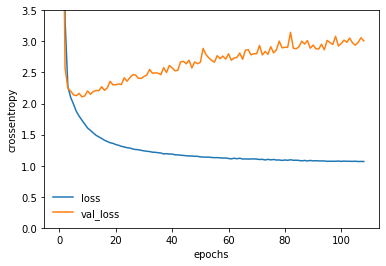

In [ ]:
# 拡大して表示
plt.plot(log.history["loss"], label="loss")
plt.plot(log.history["val_loss"], label="val_loss")
plt.legend(frameon=False)
plt.xlabel("epochs")
plt.ylabel("crossentropy")
plt.ylim(0, 3.5)
plt.show()

#### ≪結果≫  
誤差関数の値が大きくなってしまった。  
以上から、L1正則化の罰則化項の値は0.01が最も良い結果（モデル３－２）になった。

ここまで、全結合層のディープラーニングモデルで隠れ層を2層にするところまで試したが、62%までの精度しか出せなかった。  
9クラスの分類に対し、特徴量が10000個程度では少ない可能性があると考え、TF-IDF値の高い上位20000ワードくらいまで特徴量を増やしてみることにした。

#### ４．ワードの再抽出

In [ ]:
# Vectorizerの作成
# デフォルトの区切り文字には\b（単語の境界）や\w（アルファベット、アンダーバー、数字）が含まれるため、
# （任意の1文字以上の文字列）+半角スペースをトークンパターンとして設定。(?u)はUnicode (UTF-8) を示す
# celan_text_data内の文章のTF-IDF値を計算する
# max_featuresでTF-IDF値を表示する単語数を指定する（TF-IDF値が高い順に取得）。
vectorizer = TfidfVectorizer(token_pattern='(?u)(.+?) ', lowercase=False, smooth_idf=False, max_features = 20000)
X = vectorizer.fit_transform(clean_text_data)

In [ ]:
# 形状を確認
print("type:", type(X))
print("shape:", X.shape)

type: <class 'scipy.sparse.csr.csr_matrix'>
shape: (3321, 20000)


全文章データの中でTF-IDF値の高い20000ワードを抽出した。

In [ ]:
# 各列に対応したワードを取得
feature_names = vectorizer.get_feature_names()
feature_names

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['-2-hg',
 '-2hg',
 '-3′',
 '-akt',
 '-alk',
 '-approved',
 '-associated',
 '-based',
 '-bcl10',
 '-binding',
 '-bound',
 '-catenin',
 '-conjugated',
 '-defi',
 '-dependent',
 '-enhancer',
 '-expressing',
 '-gfp',
 '-his',
 '-independent',
 '-induced',
 '-labeled',
 '-like',
 '-luciferase',
 '-mediated',
 '-mutant',
 '-mutated',
 '-mutation',
 '-negative',
 '-null',
 '-pcr',
 '-phase',
 '-positive',
 '-related',
 '-resistant',
 '-ros1',
 '-selectable',
 '-tagged',
 '-thymidine',
 '-tkd',
 '-transferase',
 '-treated',
 'a-32p',
 'a-avgd',
 'a-c',
 'a-class',
 'a-flag',
 'a-gvgd',
 'a-helices',
 'a-loop',
 'a-raf',
 'a-sepharose',
 'a-t',
 'a1020v',
 'a1099t',
 'a121e',
 'a121p',
 'a121v',
 'a126d',
 'a126g',
 'a126s',
 'a126v',
 'a134d',
 'a1459p',
 'a146',
 'a146t',
 'a148t',
 'a159',
 'a159t',
 'a159v',
 'a1623g',
 'a1708e',
 'a1708v',
 'a1752p',
 'a1789',
 'a1789t',
 'a1843p',
 'a1843t',
 'a19v',
 'a20',
 'a253',
 'a2643g',
 'a266',
 'a280g',
 'a289v',
 'a339v',
 'a347t',
 'a34d',
 '

In [ ]:
# TF-IDF値
values = X.toarray()
print(type(values))

<class 'numpy.ndarray'>


In [ ]:
# DataFrameに表示
tfidf_df = pd.DataFrame(values, columns = feature_names)
tfidf_df.head()

,-2-hg,-2hg,-3′,-akt,-alk,-approved,-associated,-based,-bcl10,-binding,-bound,-catenin,-conjugated,-defi,-dependent,-enhancer,-expressing,-gfp,-his,-independent,-induced,-labeled,-like,-luciferase,-mediated,-mutant,-mutated,-mutation,-negative,-null,-pcr,-phase,-positive,-related,-resistant,-ros1,-selectable,-tagged,-thymidine,-tkd,-transferase,-treated,a-32p,a-avgd,a-c,a-class,a-flag,a-gvgd,a-helices,a-loop,a-raf,a-sepharose,a-t,a1020v,a1099t,a121e,a121p,a121v,a126d,a126g,a126s,a126v,a134d,a1459p,a146,a146t,a148t,a159,a159t,a159v,a1623g,a1708e,a1708v,a1752p,a1789,a1789t,a1843p,a1843t,a19v,a20,a253,a2643g,a266,a280g,a289v,a339v,a347t,a34d,a36p,a375,a391e,a431,a4502,a461t,a498,a504,a549,a57,a59g,a600,a607t,a60r,a614d,a620,a622v,a634d,a648t,a66,a673,a68l,a68t,a72v,a73a,a750,a75p,a763,a763v,a767,a767insai,a775,a829p,a859t,a883f,a883t,a889p,a95d,aa1077,aaa,aac,aacr,aacrjournals,aag,aale,aas,aassessed,aat,ab-1,abbott,abbreviated,abbreviation,abbreviations,abc,abc-dlbcl,abc-dlbcls,abcam,abcb7,abcc5,abd,abd-rbd,abdollah,abdomen,abdominal,abd–rbd,aberrant,aberrantly,aberration,aberrations,abh2,abh2-dna,abh3,abi,abilities,ability,abiraterone,abiraterone-resistant,abkevich,abl,abl1,ablate,ablated,ablates,ablation,able,abnormal,abnormalities,abnormality,abnormally,abolish,abolished,abolishes,abolishing,above-mentioned,abraxas,abrogate,abrogated,abrogates,abrogating,abrogation,abs,abscesses,absence,absent,absolute,absolutely,absorbance,absorption,abstract,abstracts,abstract•,abt-737,abundance,abundant,abundantly,ac-15,ac220,aca,acacggctttacctccaatg,acad,academic,academy,acanthosis,acc,accelerate,accelerated,accelerates,accelerating,acceleration,accelrys,acceptable,accepted,acceptor,accepts,access,accessed,accessibility,accessible,accession,accessory,accident,accommodate,accommodated,accompanied,accompanies,accompanying,accomplish,accomplished,accord,accordance,according,accordingly,account,accounted,accounting,accounts,accrual,accrued,accs,accumulate,accumulated,accumulates,accumulating,accumulation,accumulative,accuracy,accurate,accurately,acetate,acetic,acetone,acetonitrile,acetyl,acetyl-coa,acetylate,acetylated,acetylates,acetylation,acetyltransferase,acetyltransferases,acg,acgh,ach,achievable,achieve,achieved,achievement,achieves,achieving,achilles,achondroplasia,acid,acid-,acidic,acids,acinar,acini,acknowledge,acknowledgements•,acknowledgments•,acml,acp1,acquire,acquired,acquires,acquiring,acquisition,acral,across,acrylamide,acs,act,acta,actb,acted,actin,actin-binding,acting,actinomycin,action,actionable,actions,activate,activated,activates,activating,activation,activation-induced,activation-loop,activations,activator,activators,active,active-site,actively,activin,activities,activity,activity10,activity”,actn1,acts,actual,actually,acute,acutely,acvr1,ad1,adam,adam10,adapt,adaptation,adapted,adapter,adapter-binding,adapters,adaptive,adaptor,adaptor-binding,adaptors,adc,add,added,addgene,addicted,addiction,adding,addition,additional,additionally,additive,address,addressed,addresses,addressing,adds,adduct,adducts,ade,ade2,ade2-101,ade2–101,adenine,adeno,adenocarcinoma,adenocarcinomas,adenoma,adenoma-carcinoma,adenomas,adenomatous,adenosine,adenosquamous,adenoviral,adenovirus,adenoviruses,adenylate,adenylyl,adequate,adequately,adhere,adherence,adherens,adherent,adhesion,adhesions,adhesive,adipocyte,adipocytes,adipogenesis,adiponectin,adipose,adjacent,adjunct,adjust,adjusted,adjusting,adjustment,adjustments,adjuvant,adk,administered,administration,admitted,admixed,admixture,adobe,adolescence,adolescents,adomet,adopt,adopted,adopting,adoption,adopts,adp,adp-ribose,adrenal,adrenocortical,adriamycin,adsq,adt,adult,adulthood,adults,advance,advanced,advanced-stage,advancement,advancements,advances,advancing,advantage,advantageous,advantages,advent,adverse,adversely,advertisement,advice,advised,aee788,aegfr,aerobic,aes,aetiology,af-2,af036760,af1,af2,af207822,af355273,af4,af416868,af9,afatinib,affect,affected,affecting,affects,afferent,affi,aff

In [ ]:
# 形状を確認
tfidf_df.shape

(3321, 20000)

#### ５．モデルの作成

#### ５－１．ロジスティック回帰モデル

In [ ]:
# 説明変数に遺伝子名を入れたいので、これをカテゴリー変数化する
var_data2_ = pd.get_dummies(data=var_data, columns=['Gene'])
var_data2_.head()

,ID,Variation,Class,Gene_ABL1,Gene_ACVR1,Gene_AGO2,Gene_AKT1,Gene_AKT2,Gene_AKT3,Gene_ALK,Gene_APC,Gene_AR,Gene_ARAF,Gene_ARID1A,Gene_ARID1B,Gene_ARID2,Gene_ARID5B,Gene_ASXL1,Gene_ASXL2,Gene_ATM,Gene_ATR,Gene_ATRX,Gene_AURKA,Gene_AURKB,Gene_AXIN1,Gene_AXL,Gene_B2M,Gene_BAP1,Gene_BARD1,Gene_BCL10,Gene_BCL2,Gene_BCL2L11,Gene_BCOR,Gene_BRAF,Gene_BRCA1,Gene_BRCA2,Gene_BRD4,Gene_BRIP1,Gene_BTK,Gene_CARD11,Gene_CARM1,Gene_CASP8,Gene_CBL,Gene_CCND1,Gene_CCND2,Gene_CCND3,Gene_CCNE1,Gene_CDH1,Gene_CDK12,Gene_CDK4,Gene_CDK6,Gene_CDK8,Gene_CDKN1A,Gene_CDKN1B,Gene_CDKN2A,Gene_CDKN2B,Gene_CDKN2C,Gene_CEBPA,Gene_CHEK2,Gene_CIC,Gene_CREBBP,Gene_CTCF,Gene_CTLA4,Gene_CTNNB1,Gene_DDR2,Gene_DICER1,Gene_DNMT3A,Gene_DNMT3B,Gene_DUSP4,Gene_EGFR,Gene_EIF1AX,Gene_ELF3,Gene_EP300,Gene_EPAS1,Gene_EPCAM,Gene_ERBB2,Gene_ERBB3,Gene_ERBB4,Gene_ERCC2,Gene_ERCC3,Gene_ERCC4,Gene_ERG,Gene_ERRFI1,Gene_ESR1,Gene_ETV1,Gene_ETV6,Gene_EWSR1,Gene_EZH2,Gene_FAM58A,Gene_FANCA,Gene_FANCC,Gene_FAT1,Gene_FBXW7,Gene_FGF19,Gene_FGF3,Gene_FGF4,Gene_FGFR1,Gene_FGFR2,Gene_FGFR3,Gene_FGFR4,Gene_FLT1,Gene_FLT3,Gene_FOXA1,Gene_FOXL2,Gene_FOXO1,Gene_FOXP1,Gene_FUBP1,Gene_GATA3,Gene_GLI1,Gene_GNA11,Gene_GNAQ,Gene_GNAS,Gene_H3F3A,Gene_HIST1H1C,Gene_HLA-A,Gene_HLA-B,Gene_HNF1A,Gene_HRAS,Gene_IDH1,Gene_IDH2,Gene_IGF1R,Gene_IKBKE,Gene_IKZF1,Gene_IL7R,Gene_INPP4B,Gene_JAK1,Gene_JAK2,Gene_JUN,Gene_KDM5A,Gene_KDM5C,Gene_KDM6A,Gene_KDR,Gene_KEAP1,Gene_KIT,Gene_KLF4,Gene_KMT2A,Gene_KMT2B,Gene_KMT2C,Gene_KMT2D,Gene_KNSTRN,Gene_KRAS,Gene_LATS1,Gene_LATS2,Gene_MAP2K1,Gene_MAP2K2,Gene_MAP2K4,Gene_MAP3K1,Gene_MAPK1,Gene_MDM2,Gene_MDM4,Gene_MED12,Gene_MEF2B,Gene_MEN1,Gene_MET,Gene_MGA,Gene_MLH1,Gene_MPL,Gene_MSH2,Gene_MSH6,Gene_MTOR,Gene_MYC,Gene_MYCN,Gene_MYD88,Gene_MYOD1,Gene_NCOR1,Gene_NF1,Gene_NF2,Gene_NFE2L2,Gene_NFKBIA,Gene_NKX2-1,Gene_NOTCH1,Gene_NOTCH2,Gene_NPM1,Gene_NRAS,Gene_NSD1,Gene_NTRK1,Gene_NTRK2,Gene_NTRK3,Gene_NUP93,Gene_PAK1,Gene_PAX8,Gene_PBRM1,Gene_PDGFRA,Gene_PDGFRB,Gene_PIK3CA,Gene_PIK3CB,Gene_PIK3CD,Gene_PIK3R1,Gene_PIK3R2,Gene_PIK3R3,Gene_PIM1,Gene_PMS1,Gene_PMS2,Gene_POLE,Gene_PPM1D,Gene_PPP2R1A,Gene_PPP6C,Gene_PRDM1,Gene_PTCH1,Gene_PTEN,Gene_PTPN11,Gene_PTPRD,Gene_PTPRT,Gene_RAB35,Gene_RAC1,Gene_RAD21,Gene_RAD50,Gene_RAD51B,Gene_RAD51C,Gene_RAD51D,Gene_RAD54L,Gene_RAF1,Gene_RARA,Gene_RASA1,Gene_RB1,Gene_RBM10,Gene_RET,Gene_RHEB,Gene_RHOA,Gene_RICTOR,Gene_RIT1,Gene_RNF43,Gene_ROS1,Gene_RRAS2,Gene_RUNX1,Gene_RXRA,Gene_RYBP,Gene_SDHB,Gene_SDHC,Gene_SETD2,Gene_SF3B1,Gene_SHOC2,Gene_SHQ1,Gene_SMAD2,Gene_SMAD3,Gene_SMAD4,Gene_SMARCA4,Gene_SMARCB1,Gene_SMO,Gene_SOS1,Gene_SOX9,Gene_SPOP,Gene_SRC,Gene_SRSF2,Gene_STAG2,Gene_STAT3,Gene_STK11,Gene_TCF3,Gene_TCF7L2,Gene_TERT,Gene_TET1,Gene_TET2,Gene_TGFBR1,Gene_TGFBR2,Gene_TMPRSS2,Gene_TP53,Gene_TP53BP1,Gene_TSC1,Gene_TSC2,Gene_U2AF1,Gene_VEGFA,Gene_VHL,Gene_WHSC1,Gene_WHSC1L1,Gene_XPO1,Gene_XRCC2,Gene_YAP1
0,0,Truncating Mutations,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,W802*,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2,Q249E,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [ ]:
# 文章データから抽出した20000ワード分のTF-IDF値のDataFrameを結合する
var_data2 = pd.concat([var_data2_, tfidf_df], axis=1)
var_data2.head()

,ID,Variation,Class,Gene_ABL1,Gene_ACVR1,Gene_AGO2,Gene_AKT1,Gene_AKT2,Gene_AKT3,Gene_ALK,Gene_APC,Gene_AR,Gene_ARAF,Gene_ARID1A,Gene_ARID1B,Gene_ARID2,Gene_ARID5B,Gene_ASXL1,Gene_ASXL2,Gene_ATM,Gene_ATR,Gene_ATRX,Gene_AURKA,Gene_AURKB,Gene_AXIN1,Gene_AXL,Gene_B2M,Gene_BAP1,Gene_BARD1,Gene_BCL10,Gene_BCL2,Gene_BCL2L11,Gene_BCOR,Gene_BRAF,Gene_BRCA1,Gene_BRCA2,Gene_BRD4,Gene_BRIP1,Gene_BTK,Gene_CARD11,Gene_CARM1,Gene_CASP8,Gene_CBL,Gene_CCND1,Gene_CCND2,Gene_CCND3,Gene_CCNE1,Gene_CDH1,Gene_CDK12,Gene_CDK4,Gene_CDK6,Gene_CDK8,Gene_CDKN1A,Gene_CDKN1B,Gene_CDKN2A,Gene_CDKN2B,Gene_CDKN2C,Gene_CEBPA,Gene_CHEK2,Gene_CIC,Gene_CREBBP,Gene_CTCF,Gene_CTLA4,Gene_CTNNB1,Gene_DDR2,Gene_DICER1,Gene_DNMT3A,Gene_DNMT3B,Gene_DUSP4,Gene_EGFR,Gene_EIF1AX,Gene_ELF3,Gene_EP300,Gene_EPAS1,Gene_EPCAM,Gene_ERBB2,Gene_ERBB3,Gene_ERBB4,Gene_ERCC2,Gene_ERCC3,Gene_ERCC4,Gene_ERG,Gene_ERRFI1,Gene_ESR1,Gene_ETV1,Gene_ETV6,Gene_EWSR1,Gene_EZH2,Gene_FAM58A,Gene_FANCA,Gene_FANCC,Gene_FAT1,Gene_FBXW7,Gene_FGF19,Gene_FGF3,Gene_FGF4,Gene_FGFR1,Gene_FGFR2,Gene_FGFR3,Gene_FGFR4,Gene_FLT1,Gene_FLT3,Gene_FOXA1,Gene_FOXL2,Gene_FOXO1,Gene_FOXP1,Gene_FUBP1,Gene_GATA3,Gene_GLI1,Gene_GNA11,Gene_GNAQ,Gene_GNAS,Gene_H3F3A,Gene_HIST1H1C,Gene_HLA-A,Gene_HLA-B,Gene_HNF1A,Gene_HRAS,Gene_IDH1,Gene_IDH2,Gene_IGF1R,Gene_IKBKE,Gene_IKZF1,Gene_IL7R,Gene_INPP4B,Gene_JAK1,Gene_JAK2,Gene_JUN,Gene_KDM5A,Gene_KDM5C,Gene_KDM6A,Gene_KDR,Gene_KEAP1,Gene_KIT,Gene_KLF4,Gene_KMT2A,Gene_KMT2B,Gene_KMT2C,Gene_KMT2D,Gene_KNSTRN,Gene_KRAS,Gene_LATS1,Gene_LATS2,Gene_MAP2K1,Gene_MAP2K2,Gene_MAP2K4,Gene_MAP3K1,Gene_MAPK1,Gene_MDM2,Gene_MDM4,Gene_MED12,Gene_MEF2B,Gene_MEN1,Gene_MET,Gene_MGA,Gene_MLH1,Gene_MPL,Gene_MSH2,Gene_MSH6,Gene_MTOR,Gene_MYC,Gene_MYCN,Gene_MYD88,Gene_MYOD1,Gene_NCOR1,Gene_NF1,Gene_NF2,Gene_NFE2L2,Gene_NFKBIA,Gene_NKX2-1,Gene_NOTCH1,Gene_NOTCH2,Gene_NPM1,Gene_NRAS,Gene_NSD1,Gene_NTRK1,Gene_NTRK2,Gene_NTRK3,Gene_NUP93,Gene_PAK1,Gene_PAX8,Gene_PBRM1,Gene_PDGFRA,Gene_PDGFRB,Gene_PIK3CA,Gene_PIK3CB,Gene_PIK3CD,Gene_PIK3R1,Gene_PIK3R2,Gene_PIK3R3,Gene_PIM1,Gene_PMS1,Gene_PMS2,Gene_POLE,Gene_PPM1D,Gene_PPP2R1A,Gene_PPP6C,Gene_PRDM1,Gene_PTCH1,Gene_PTEN,Gene_PTPN11,Gene_PTPRD,Gene_PTPRT,Gene_RAB35,Gene_RAC1,Gene_RAD21,Gene_RAD50,Gene_RAD51B,Gene_RAD51C,Gene_RAD51D,Gene_RAD54L,Gene_RAF1,Gene_RARA,Gene_RASA1,Gene_RB1,Gene_RBM10,Gene_RET,Gene_RHEB,Gene_RHOA,Gene_RICTOR,Gene_RIT1,Gene_RNF43,Gene_ROS1,Gene_RRAS2,Gene_RUNX1,Gene_RXRA,Gene_RYBP,Gene_SDHB,Gene_SDHC,Gene_SETD2,Gene_SF3B1,Gene_SHOC2,Gene_SHQ1,Gene_SMAD2,Gene_SMAD3,Gene_SMAD4,Gene_SMARCA4,Gene_SMARCB1,Gene_SMO,Gene_SOS1,Gene_SOX9,Gene_SPOP,Gene_SRC,Gene_SRSF2,Gene_STAG2,Gene_STAT3,Gene_STK11,Gene_TCF3,Gene_TCF7L2,Gene_TERT,Gene_TET1,Gene_TET2,Gene_TGFBR1,Gene_TGFBR2,Gene_TMPRSS2,Gene_TP53,Gene_TP53BP1,Gene_TSC1,Gene_TSC2,Gene_U2AF1,Gene_VEGFA,Gene_VHL,Gene_WHSC1,Gene_WHSC1L1,Gene_XPO1,Gene_XRCC2,Gene_YAP1,-2-hg,-2hg,-3′,-akt,-alk,-approved,-associated,-based,-bcl10,-binding,-bound,-catenin,-conjugated,-defi,-dependent,-enhancer,-expressing,-gfp,-his,-independent,-induced,-labeled,-like,-luciferase,-mediated,-mutant,-mutated,-mutation,-negative,-null,-pcr,-phase,-positive,-related,-resistant,-ros1,-selectable,-tagged,-thymidine,-tkd,-transferase,-treated,a-32p,a-avgd,a-c,a-class,a-flag,a-gvgd,a-helices,a-loop,a-raf,a-sepharose,a-t,a1020v,a1099t,a121e,a121p,a121v,a126d,a126g,a126s,a126v,a134d,a1459p,a146,a146t,a148t,a159,a159t,a159v,a1623g,a1708e,a1708v,a1752p,a1789,a1789t,a1843p,a1843t,a19v,a20,a253,a2643g,a266,a280g,a289v,a339v,a347t,a34d,a36p,a375,a391e,a431,a4502,a461t,a498,a504,a549,a57,a59g,a600,a607t,a60r,a614d,a620,a622v,a634d,a648t,a66,a673,a68l,a68t,a72v,a73a,a750,a75p,a763,a763v,a767,a767insai,a775,a829p,a859t,a883f,a883t,a889p,a95d,aa1077,aaa,aac,aacr,aacrjournals,aag,aale,aas,aassessed,aat,ab-1,abbott,abbreviated,abbreviation,abbreviations,abc,abc-dlbcl,abc-dlbcls,abcam,abcb7,abcc5,abd,abd-rbd,abdollah,abdomen,abdominal,abd–rbd,aberrant,aberrantly,aberration,aberrations,abh2,abh2-dna,abh3,abi,abilities,ability,abiratero

In [ ]:
# 説明変数(X)：20000ワード分のTF-IDF値と264種類の遺伝子名
X = np.array(var_data2.iloc[:, 3:])

In [ ]:
# 目的変数(Y)：Class1~Class9
Y = np.array(var_data["Class"])

In [ ]:
# データの分割
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
X_train, X_valid, Y_train, Y_valid = train_test_split(X_train, Y_train, test_size=0.3, random_state=0)

In [ ]:
# 形状を確認
print("Y_train=", Y_train.shape, ", X_train=", X_train.shape)
print("Y_valid=", Y_valid.shape, ", X_valid=", X_valid.shape)
print("Y_test=", Y_test.shape, ", X_test=", X_test.shape)

Y_train= (1626,) , X_train= (1626, 20264)
Y_valid= (698,) , X_valid= (698, 20264)
Y_test= (997,) , X_test= (997, 20264)


In [ ]:
logistic_model = LogisticRegression(solver='lbfgs', multi_class='multinomial')
# 学習
logistic_model.fit(X_train, Y_train)
# 予測
Y_pred = logistic_model.predict(X_valid)

In [ ]:
# モデルの評価
print(classification_report(Y_valid, Y_pred))

              precision    recall  f1-score   support

           1       0.54      0.60      0.57       127
           2       0.45      0.37      0.41        67
           3       0.00      0.00      0.00        18
           4       0.64      0.65      0.65       145
           5       0.45      0.24      0.31        54
           6       0.71      0.62      0.67        64
           7       0.69      0.87      0.77       210
           8       0.00      0.00      0.00         4
           9       1.00      0.44      0.62         9

    accuracy                           0.62       698
   macro avg       0.50      0.42      0.44       698
weighted avg       0.59      0.62      0.60       698



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### ≪結果≫  
精度は変わらなかった。

#### ５－２．ディープラーニングモデル

In [ ]:
# 目的変数(Class1～9)をカテゴリー変数化する
var_data3 = pd.get_dummies(data=var_data, columns=['Class'])
var_data3.head()

,ID,Gene,Variation,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9
0,0,FAM58A,Truncating Mutations,1,0,0,0,0,0,0,0,0
1,1,CBL,W802*,0,1,0,0,0,0,0,0,0
2,2,CBL,Q249E,0,1,0,0,0,0,0,0,0
3,3,CBL,N454D,0,0,1,0,0,0,0,0,0
4,4,CBL,L399V,0,0,0,1,0,0,0,0,0


In [ ]:
# 目的変数(Y)：Class1~Class9をカテゴリー変数化したもの
Y = np.array(var_data3.loc[:, "Class_1":"Class_9"])

In [ ]:
# 説明変数(X)：ロジスティック回帰モデルと同じ
# 形状を確認
print("Y:", Y.shape, ", X:", X.shape)

Y: (3321, 9) , X: (3321, 20264)


In [ ]:
# データの分割
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
X_train, X_valid, Y_train, Y_valid = train_test_split(X_train, Y_train, test_size=0.3, random_state=0)

In [ ]:
# 形状を確認
print("Y_train=", Y_train.shape, ", X_train=", X_train.shape)
print("Y_valid=", Y_valid.shape, ", X_valid=", X_valid.shape)
print("Y_test=", Y_test.shape, ", X_test=", X_test.shape)

Y_train= (1626, 9) , X_train= (1626, 20264)
Y_valid= (698, 9) , X_valid= (698, 20264)
Y_test= (997, 9) , X_test= (997, 20264)


In [ ]:
# モデルの初期化
model = keras.Sequential()

# 入力層
model.add(Dense(1024, activation='relu', input_shape=(20264, )))
# 隠れ層
model.add(Dense(256, activation='relu'))
# 隠れ層
model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.01)))
# 出力層
model.add(Dense(9, activation='softmax'))

# モデルの構築
model.compile(optimizer="rmsprop", loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
# モデルの構造を表示
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_32 (Dense)            (None, 1024)              20751360  
                                                                 
 dense_33 (Dense)            (None, 256)               262400    
                                                                 
 dense_34 (Dense)            (None, 64)                16448     
                                                                 
 dense_35 (Dense)            (None, 9)                 585       
                                                                 
Total params: 21,030,793
Trainable params: 21,030,793
Non-trainable params: 0
_________________________________________________________________


In [ ]:
%%time
# 学習の実施
log = model.fit(X_train, Y_train, epochs=1000, batch_size=32, verbose=True, callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=100, verbose=1)], validation_data=(X_valid, Y_valid))

Epoch 1/1000
51/51 [==============================] - 2s 19ms/step - loss: 8.3920 - accuracy: 0.4760 - val_loss: 5.3031 - val_accuracy: 0.6089
Epoch 2/1000
51/51 [==============================] - 1s 15ms/step - loss: 3.5750 - accuracy: 0.6581 - val_loss: 2.5948 - val_accuracy: 0.5731
Epoch 3/1000
51/51 [==============================] - 1s 13ms/step - loss: 1.7401 - accuracy: 0.7239 - val_loss: 1.8395 - val_accuracy: 0.6160
Epoch 4/1000
51/51 [==============================] - 1s 13ms/step - loss: 1.2776 - accuracy: 0.7749 - val_loss: 1.5990 - val_accuracy: 0.6089
Epoch 5/1000
51/51 [==============================] - 1s 13ms/step - loss: 1.0482 - accuracy: 0.7940 - val_loss: 1.5391 - val_accuracy: 0.6332
Epoch 6/1000
51/51 [==============================] - 1s 13ms/step - loss: 0.9060 - accuracy: 0.8087 - val_loss: 1.5812 - val_accuracy: 0.6261
Epoch 7/1000
51/51 [==============================] - 1s 15ms/step - loss: 0.8050 - accuracy: 0.8272 - val_loss: 1.5731 - val_accuracy: 0.6232

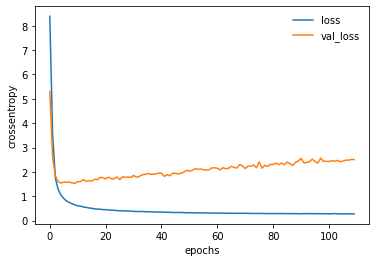

In [ ]:
# グラフの表示
plt.plot(log.history["loss"], label="loss")
plt.plot(log.history["val_loss"], label="val_loss")
plt.legend(frameon=False)
plt.xlabel("epochs")
plt.ylabel("crossentropy")
plt.show()

In [ ]:
# テストデータによる評価まで実施する
Y_pred_0 = model.predict(X_valid)

# 予測結果の各リストにおける妻財地のインデックスを取得
Y_pred = np.argmax(Y_pred_0, axis=1)

22/22 [==============================] - 0s 4ms/step


In [ ]:
# カテゴリー変数の復元
Y_valid_ = np.argmax(Y_valid, axis=1)

In [ ]:
# モデルの評価
print(classification_report(Y_valid_, Y_pred))

              precision    recall  f1-score   support

           0       0.57      0.43      0.49       127
           1       0.33      0.49      0.40        67
           2       0.50      0.50      0.50        18
           3       0.68      0.73      0.70       145
           4       0.43      0.48      0.45        54
           5       0.72      0.67      0.69        64
           6       0.76      0.72      0.74       210
           7       0.67      0.50      0.57         4
           8       0.86      0.67      0.75         9

    accuracy                           0.62       698
   macro avg       0.61      0.58      0.59       698
weighted avg       0.63      0.62      0.62       698



#### ≪結果≫  
精度は変わらなかった。

---

## 【Summary】

今回、テキストデータから遺伝子変異の種類を分類するモデルとして以下を検討した。   
- 特徴量抽出では各文章をスペースで分割し、数字のみで構成されるワードや2文字以下のワードなどをノイズとして除去した。  
- 特徴量の抽出としてBag of Words方式とTF-IDF方式を試した。  
- モデルとしてロジスティック回帰モデルと全結合層のDLモデルを試した。  
- DLモデルでは正則化項の導入や、層を深くすることによるモデルの複雑化を検討した。  

しかしながら、いずれの手法でも、テストデータを用いた性能は60%強の精度しか出せなかった。 

今後試してみたいこととして、以下を考えている。  
今回のように1つ1つの文章から特徴量生成を行うのではなく、文章データをClassごとにまとめてから特徴量生成を行うことで、各クラスに相関のある特徴量を抽出できるのではないかと考えている。  
（例えば、文章データをClassごとにまとめたうえで頻出単語を確認したり、あるいはTF-IDF値の高いワードを抽出するなど。）  
また、単語だけに着目するのではなく、文章として特徴量を生成できる手法（Doc2Vec）も試したみたいと考えている。

---

Classごとに文章データをまとめた解析（途中経過）

In [ ]:
# Class1に分類される文章データをtext_dataから抽出(var_dataとtext_dataはIDでリンク)
var_data_class1 = var_data[var_data["Class"] == 1]
# Class1に分類されたIDを格納するリストを作成
class1_id = list(var_data_class1["ID"])

# Class1に分類される文章データを格納するリスト
text_data_class1 = []
with open("/content/drive/MyDrive/Colab Notebooks/Personalized Medicine/training_text", "r") as f:
    text_data = f.readlines()
    # 見出しの行はカット
    text_data.pop(0)
    
    # text_dataのうち、class1_idに含まれるIDの文章データのみ取得
    for i in class1_id:
        text_data_class1.append(text_data[i])

print(type(text_data_class1))
print(len(text_data_class1))

<class 'list'>
568


In [ ]:
# リストtext_data_class1の要素を結合する
#（Class1に分類される全テキストデータが1つのリストに纏められるようにする）
text_data_class1 = "".join(text_data_class1)

In [ ]:
# テキストデータ解析用の関数を作成する
# 文章データに使われている単語ごとの数を返す
def get_word_count(text_data, min_length=3):
    # ノイズの除去
    for ch in ".,:;°!?+*/=|()[]{}<>~^#$@%&'\"_":
        text_data = text_data.replace(ch, " ")
    
    # 形態素解析：スペースで分割（戻り値はリスト型）
    results = text_data.strip().split()
    
    # 小文字化（表記の揺れを補正）
    results = [result.lower() for result in results if len(result) >= min_length]
    
    # stop_wordsの定義
    stop_words = ['fig', 'figs', 'however', 'whereas', 'another', 'either', 'yet', 'known', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves',\
            'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',\
            'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'whose', 'this', 'that',\
            "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', \
            'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'thus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into',\
            'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such',\
            'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'could', 'will', 'would', 'may', 'might', 'must', 'just', 'don', "don't", 'should', "should've",\
            'now', 'd', 'll', 'm', 'o', 're', 've', 'y', 'ain', 'aren', "aren't", 'cannot', 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't",\
            'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn',\
            "shouldn't", 'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"]

   # 分析対象外のワードを除去
    words = []
    for word in results:
        if len(word) < 3:
            # 2文字以下のワード
            continue

        elif re.match(r"^[0-9!-/:-@¥[-`{-~–·•]+$", word):
            # 数字や記号だけで構成されたワード(ASCIIコード表の記号と–·•を指定)
            # ^:文字列の先頭、$:文字列の末尾、[]:カッコ内にある任意の1文字
            continue

        elif re.match(r"^[0-9]+.*$", word):
            # 数字からはじまるワード
            continue

        elif word in stop_words:
            # stop_wordsに該当するもの
            continue
        
        words.append(word)
        
    # ワードごとの出現数を数える（戻り値は辞書型のサブクラス）    
    count = collections.Counter(words)

    # 辞書型に変換
    count = dict(count)

    # 出現数の多い順にソート（戻り値はキーと要素をタプルとしたリスト型になる）
    count = sorted(count.items(), key=lambda x:x[1], reverse=True)
    
    # 辞書型に戻す
    count = dict(count)
    
    return count

In [ ]:
# Class1の全文章データに使われている単語の出現数を解析する
count_class1 = get_word_count(text_data_class1)
count_class1

{'mutations': 33696,
 'cells': 28300,
 'cell': 17589,
 'figure': 17087,
 'p53': 16904,
 'mutation': 16801,
 'cancer': 16590,
 'protein': 16585,
 'expression': 14168,
 'variants': 13734,
 'dna': 12943,
 'gene': 12388,
 'mutant': 12129,
 'binding': 11744,
 'also': 11169,
 'domain': 10810,
 'using': 10731,
 'data': 10507,
 'analysis': 10429,
 'tumor': 10329,
 'wild-type': 10286,
 'activity': 10057,
 'genes': 9531,
 'table': 9500,
 'two': 9334,
 'patients': 9069,
 'tumors': 8517,
 'brca1': 8503,
 'proteins': 8411,
 'one': 7919,
 'results': 7883,
 'mutants': 7567,
 'function': 7425,
 'shown': 7353,
 'human': 7029,
 'identified': 6831,
 'used': 6698,
 'functional': 6380,
 'found': 5926,
 'supplementary': 5867,
 'structure': 5839,
 'loss': 5794,
 'levels': 5623,
 'residues': 5606,
 'observed': 5505,
 'sequence': 5388,
 'study': 5359,
 'activation': 5279,
 'missense': 5276,
 'amino': 5260,
 'control': 5255,
 'cases': 5216,
 'different': 5211,
 'studies': 5180,
 'complex': 5138,
 'variant': 507